<hr class="solid">

# 1. Food Preference
<a id="1"></a> 


**Main goal:** Divide customers taking into consideration their product usage – which type of dishes they order more often.

- MntMeat&Fish
- MntEntries
- MntVegan&Vegetarian
- MntDrinks
- MntDesserts
- MntAdditionalRequests

<hr class="solid">

In [1]:
## Importing what we need (some of it)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer


## Import data files
sales = pd.read_csv('https://raw.githubusercontent.com/EFSA-Jedi-Group/Data-Science-and-ML/main/Data/sales.csv')

In [2]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7008 entries, 0 to 7007
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CustomerID             7008 non-null   int64  
 1   Date_Adherence         7008 non-null   object 
 2   Recency                6985 non-null   float64
 3   MntMeat&Fish           7008 non-null   float64
 4   MntEntries             7008 non-null   int64  
 5   MntVegan&Vegetarian    7008 non-null   float64
 6   MntDrinks              6980 non-null   float64
 7   MntDesserts            7008 non-null   float64
 8   MntAdditionalRequests  7008 non-null   float64
 9   NumOfferPurchases      7008 non-null   int64  
 10  NumAppPurchases        7008 non-null   int64  
 11  NumTakeAwayPurchases   7008 non-null   int64  
 12  NumStorePurchases      7008 non-null   int64  
 13  NumAppVisitsMonth      7008 non-null   int64  
 14  Complain               7008 non-null   int64  
dtypes: f

#### Lets first take out our duplicate values

In [3]:
sales.drop(sales[sales.duplicated()].index, inplace = True)
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7007
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   CustomerID             7000 non-null   int64  
 1   Date_Adherence         7000 non-null   object 
 2   Recency                6977 non-null   float64
 3   MntMeat&Fish           7000 non-null   float64
 4   MntEntries             7000 non-null   int64  
 5   MntVegan&Vegetarian    7000 non-null   float64
 6   MntDrinks              6972 non-null   float64
 7   MntDesserts            7000 non-null   float64
 8   MntAdditionalRequests  7000 non-null   float64
 9   NumOfferPurchases      7000 non-null   int64  
 10  NumAppPurchases        7000 non-null   int64  
 11  NumTakeAwayPurchases   7000 non-null   int64  
 12  NumStorePurchases      7000 non-null   int64  
 13  NumAppVisitsMonth      7000 non-null   int64  
 14  Complain               7000 non-null   int64  
dtypes: f

#### We have now just to solve our Drinks Missing values, we won't be taking into account Recency for this analysis ####
So for this we will check correlation and apply a KNN Since the Values are not 0 (because we have value 0s) and this isnt survey/sensitive based information where bias can apply, we can apply a KNN###

Text(0.5, 1.0, 'Correlation Matrix of Numeric Sales Data')

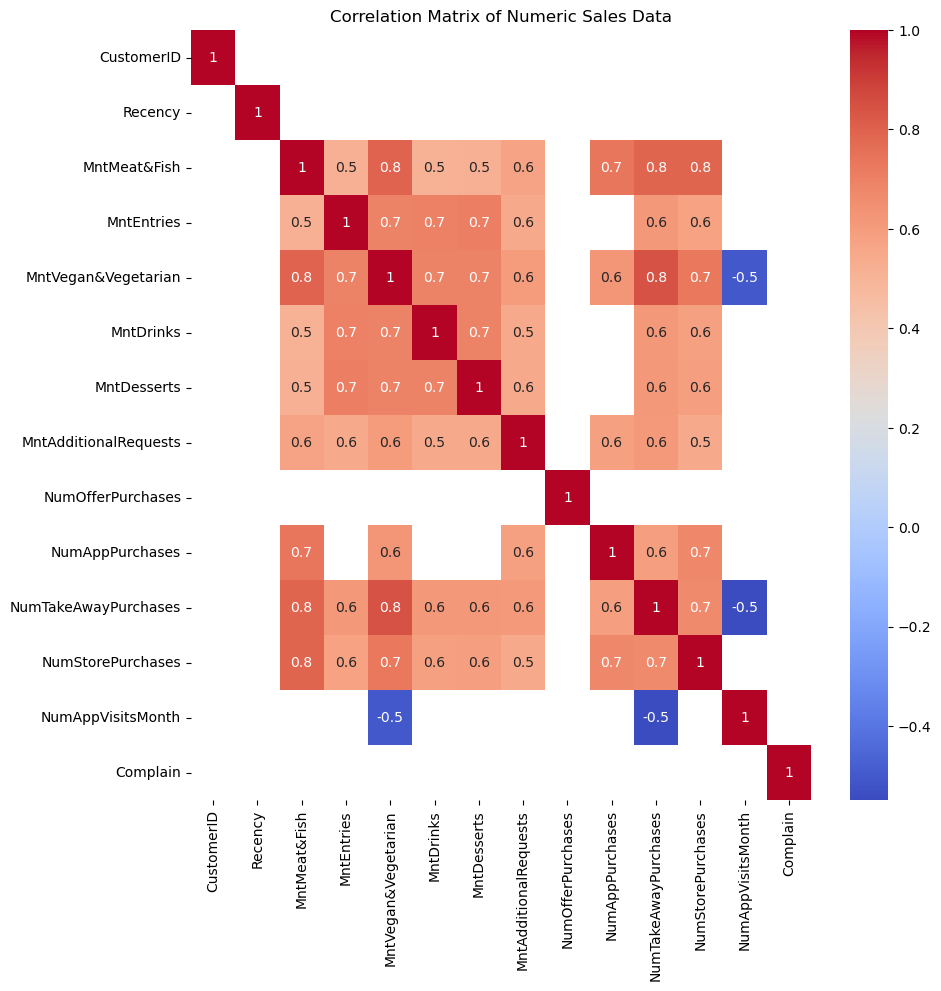

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

numeric_cols = sales.select_dtypes(include=np.number).columns.tolist()
sales_corr = sales[numeric_cols].corr(method='spearman')[(sales[numeric_cols].corr(method='spearman') > 0.5) | (sales[numeric_cols].corr(method='spearman') < -0.5)]

plt.figure(figsize=(10,10))
ax = sns.heatmap(sales_corr, annot=True, fmt='.1g', cmap='coolwarm', cbar=True)
ax.set_title('Correlation Matrix of Numeric Sales Data')

We have high correlation between Drinks,Entries, Vegetarian and Dessertts (0.7).

In [5]:
foods = sales[['MntMeat&Fish', 'MntDrinks', 'MntEntries', 'MntVegan&Vegetarian', 'MntDesserts', 'MntAdditionalRequests']]

### Filling Missing Values
Here we apply KNN without previously scaling our data, since its the same measurement unit, and it seems the missing values are at random

In [6]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
X = foods

# Define the parameter grid to search over
param_grid = {'n_neighbors': [1, 3, 5, 7, 9]}

# Define the imputer model
imputer = KNNImputer()

# Define the grid search object with 5-fold cross-validation
grid_search = GridSearchCV(imputer, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search object to the data
grid_search.fit(X)
grid_search
print("Best parameters: ", grid_search.best_params_)
print("Best negative mean squared error: ", grid_search.best_score_)

Best parameters:  {'n_neighbors': 1}
Best negative mean squared error:  nan


C:\Users\gonca\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\gonca\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 759, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
C:\Users\gonca\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\gonca\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 759, in _score
    scores = scorer(estimator, X_test)
TypeError: __call__() missing 1 required positional argument: 'y_true'

  warnings.warn(
C:\Users\gonca\anaconda3\lib\site-pack

We see it is 1 so lets use it

In [7]:
## lets get the knn values
foods_knn = foods[['MntDrinks','MntEntries','MntVegan&Vegetarian','MntDesserts']]

imputer = KNNImputer(n_neighbors=1)
array_impute = imputer.fit_transform(foods_knn) # this is an array
foods_knn = pd.DataFrame(array_impute, columns = foods_knn.columns)
foods_knn.info()
foods.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7000 entries, 0 to 6999
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   MntDrinks            7000 non-null   float64
 1   MntEntries           7000 non-null   float64
 2   MntVegan&Vegetarian  7000 non-null   float64
 3   MntDesserts          7000 non-null   float64
dtypes: float64(4)
memory usage: 218.9 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7007
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   MntMeat&Fish           7000 non-null   float64
 1   MntDrinks              6972 non-null   float64
 2   MntEntries             7000 non-null   int64  
 3   MntVegan&Vegetarian    7000 non-null   float64
 4   MntDesserts            7000 non-null   float64
 5   MntAdditionalRequests  7000 non-null   float64
dtypes: float64(5), int64(1)
m

In [8]:
food_set = foods.copy()

In [9]:
foods.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7007
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   MntMeat&Fish           7000 non-null   float64
 1   MntDrinks              6972 non-null   float64
 2   MntEntries             7000 non-null   int64  
 3   MntVegan&Vegetarian    7000 non-null   float64
 4   MntDesserts            7000 non-null   float64
 5   MntAdditionalRequests  7000 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 382.8 KB


In [10]:
food_set['MntDrinks'] = foods_knn['MntDrinks'].values
food_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7007
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   MntMeat&Fish           7000 non-null   float64
 1   MntDrinks              7000 non-null   float64
 2   MntEntries             7000 non-null   int64  
 3   MntVegan&Vegetarian    7000 non-null   float64
 4   MntDesserts            7000 non-null   float64
 5   MntAdditionalRequests  7000 non-null   float64
dtypes: float64(5), int64(1)
memory usage: 382.8 KB


In [11]:
food_set.kurt()

MntMeat&Fish             0.532098
MntDrinks                3.832031
MntEntries               4.096167
MntVegan&Vegetarian      8.431538
MntDesserts              3.813464
MntAdditionalRequests    3.084190
dtype: float64

Not looking good, high kurtosis for some variables, specially Vegans. Besides this set lets create one with the percetanges of each category of food, by Total Spent (MntTotal)

In [12]:
foods_perc = food_set.copy()
foods_perc['MntTotal'] = foods[['MntMeat&Fish', 'MntEntries', 'MntVegan&Vegetarian', 'MntDrinks', 'MntDesserts','MntAdditionalRequests']].sum(axis=1)
Mnt_Total = foods_perc['MntTotal']
foods_perc = foods_perc.div(Mnt_Total, axis=0)
foods_perc.drop('MntTotal', axis=1, inplace=True)
foods_perc

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
0,0.265805,0.143678,0.071839,0.474138,0.043103,0.001437
1,0.436467,0.063017,0.015496,0.452479,0.030992,0.001550
2,0.206795,0.000000,0.236337,0.221566,0.295421,0.039882
3,0.455753,0.090808,0.150775,0.215883,0.075388,0.011394
4,0.459086,0.061576,0.076628,0.326355,0.061576,0.014778
...,...,...,...,...,...,...
7003,0.551431,0.047084,0.079681,0.255342,0.063383,0.003079
7004,0.290160,0.014017,0.155593,0.381623,0.155593,0.003014
7005,0.489861,0.079958,0.031790,0.301286,0.096334,0.000771
7006,0.401117,0.191348,0.000000,0.379724,0.024364,0.003447


In [13]:
foods_perc.kurt()

MntMeat&Fish            -0.792750
MntDrinks                4.701864
MntEntries               4.469401
MntVegan&Vegetarian      2.113849
MntDesserts              4.882633
MntAdditionalRequests    2.515234
dtype: float64

Looking a lot better. Lets now evaluate our clusetering needs first with PCA

## Exploratory Analysis

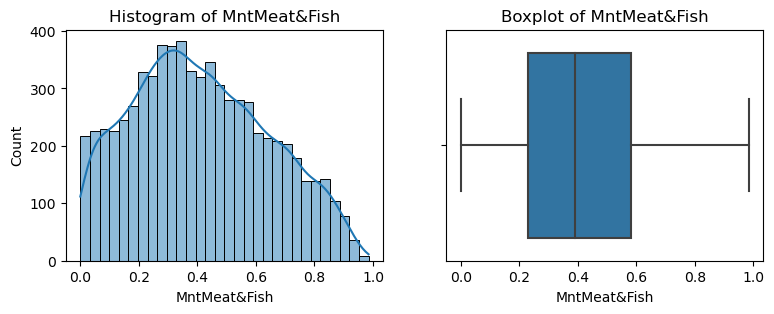

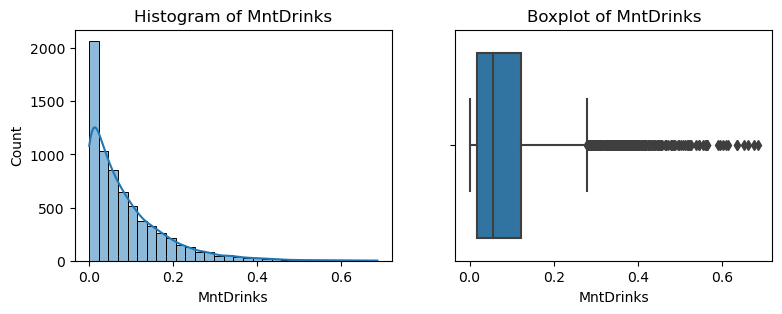

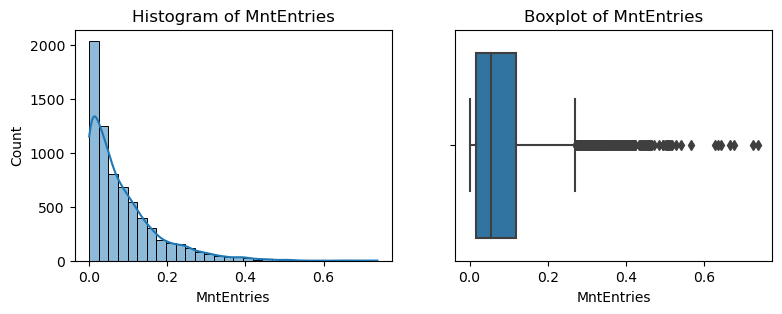

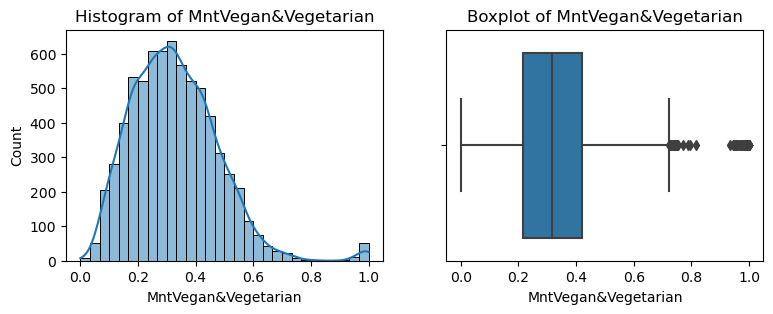

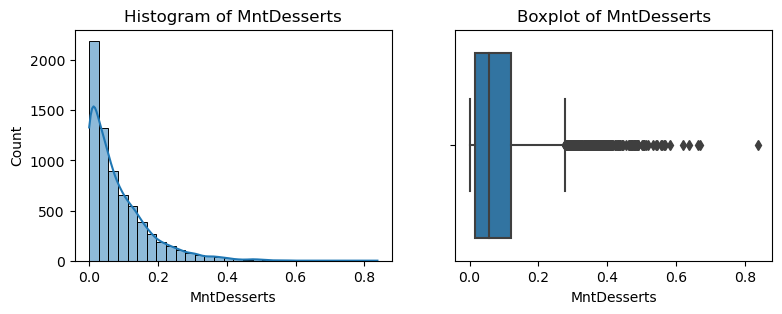

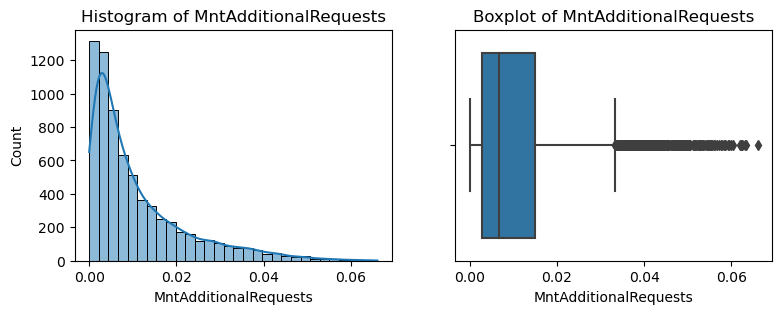

In [14]:
for i in foods_perc:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 3))
    sns.histplot(ax=ax1, x=foods_perc[i], bins=30,kde= True)
    sns.boxplot(ax=ax2, x=foods_perc[i])
    ax1.set_title(f"Histogram of {i}")
    ax2.set_title(f"Boxplot of {i}")
    plt.show()

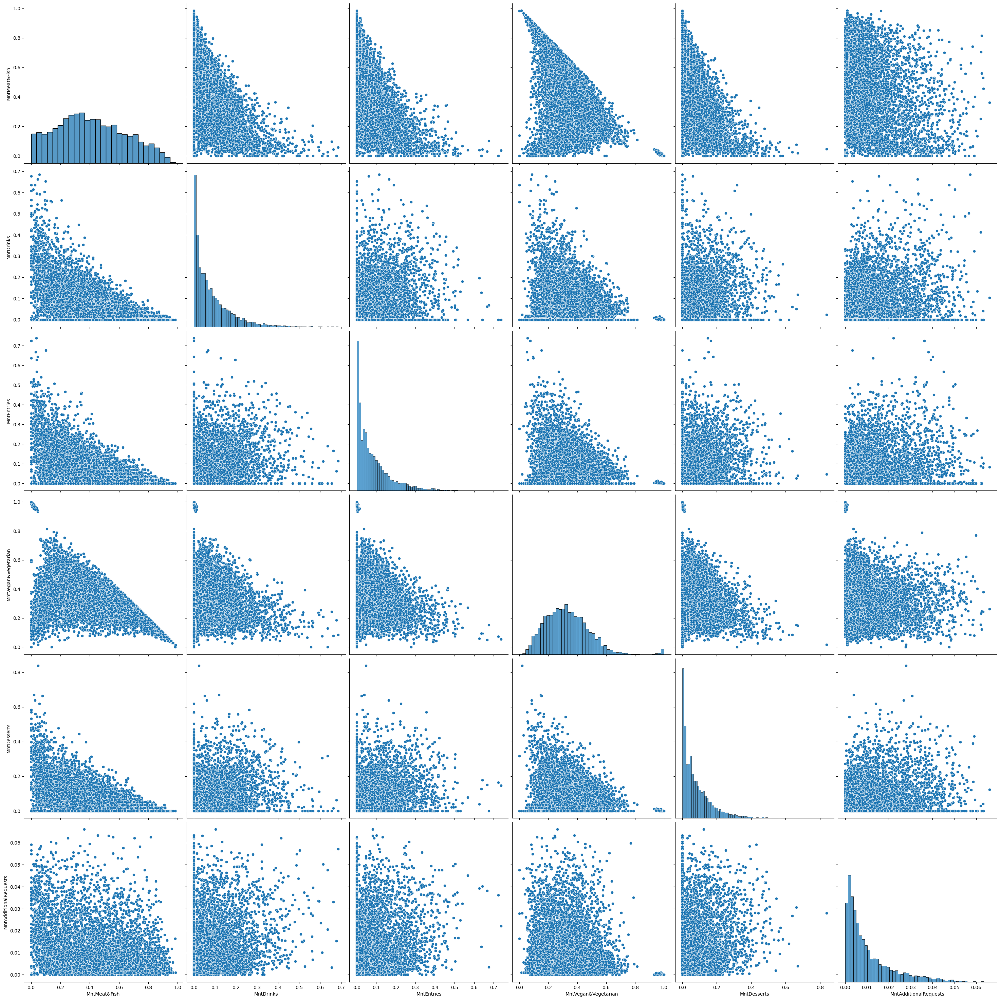

In [15]:
sns.pairplot(foods_perc, height=5)

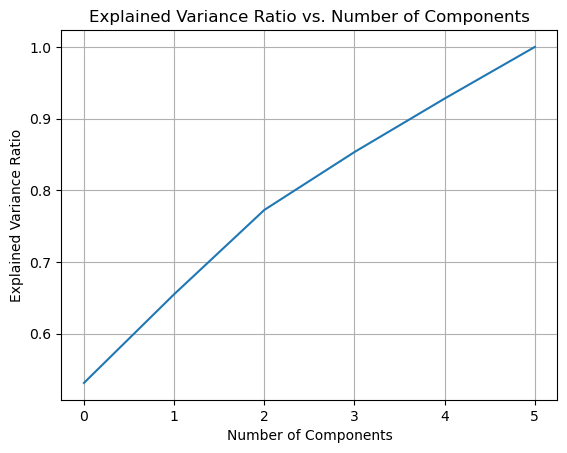

In [16]:
## No Scaling Dataset
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
foods_scaled_1 = scaler.fit_transform(food_set)

# Perform PCA
pca = PCA().fit(foods_scaled_1)

# Plot the explained variance ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio vs. Number of Components')
plt.grid(True)
plt.show()

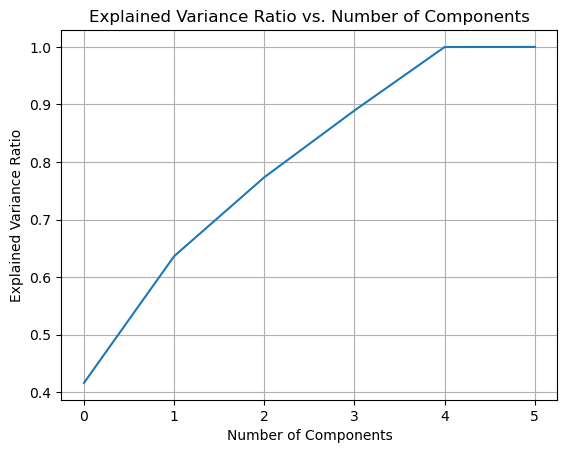

In [17]:
foods_scaled_2 = scaler.fit_transform(foods_perc)

# Perform PCA
pca = PCA().fit(foods_scaled_2)

# Plot the explained variance ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio vs. Number of Components')
plt.grid(True)
plt.show()

We see that the 2 clusters are accountable for at least .75 of variance, so lets use that

###### A function that gives scores for clusters 

In [225]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
def cluster_scores(data, labels, model):
    # Silhouette Score
    silhouette = '{:.4f}'.format(silhouette_score(data, labels))
    
    # Calinski-Harabasz Index
    calinski = '{:.4f}'.format(calinski_harabasz_score(data, labels))
    
    # Within Cluster Sum of Squares (WCSS)
    wcss = '{:.4f}'.format(np.sum(model.inertia_))
    
    # Davies-Bouldin Index
    db = '{:.4f}'.format(davies_bouldin_score(data, labels))
    
    scores_table = pd.DataFrame({'Silhouette Score': silhouette,
                                 'Calinski-Harabasz Index': calinski,
                                 'WCSS': wcss,
                                 'Davies-Bouldin Index': db}, index=[0]).T
    scores_table.columns = ['Score']
    
    return scores_table

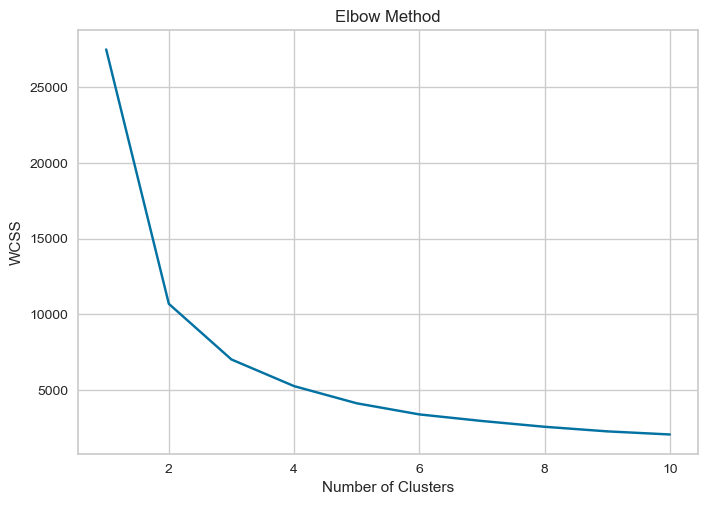

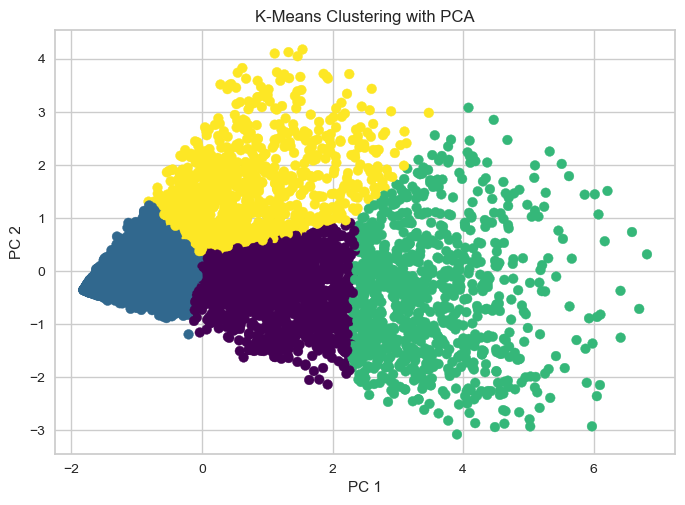

,Score
Silhouette Score,0.432871
Calinski-Harabasz Index,2707.701063
WCSS,5265.172860
Davies-Bouldin Index,1.752849


In [163]:
## For the not scaled
foods_scaled_3 = scaler.fit_transform(food_set)

pca = PCA(n_components=2)
foods_pca = pca.fit_transform(foods_scaled_3)

# Step 2: Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(foods_pca)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Step 3: Apply K-Means clustering with the optimal number of clusters (e.g. 3)
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=3000, random_state=0)
kmeans.fit(foods_pca)

# Step 4: Plot the results
plt.scatter(foods_pca[:,0], foods_pca[:,1], c=kmeans.labels_, cmap='viridis')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('K-Means Clustering with PCA')
plt.show()

cluster_scores(foods_scaled_3,kmeans.labels_,kmeans)

In [ ]:
cluster_scores(food_perc_noveg, food_model_perc_noveg_k4_['labels'],model_perc_noveg_k4_)

In [80]:
# Calculate WCSS
wcss = kmeans.inertia_

# Calculate Silhouette score
silhouette = silhouette_score(foods_pca, kmeans.labels_)

# Calculate Calinski-Harabasz Index
ch = calinski_harabasz_score(foods_pca, kmeans.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", ch)

WCSS:  5265.172860206735
Silhouette Score:  0.5549722032361671
Calinski-Harabasz Index:  9851.676723509829


In [19]:
food_set_labeled = food_set.copy()
food_set_labeled['cluster'] = kmeans.labels_
food_set_labeled

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests,cluster
0,5180.0,2800.0,1400,9240.0,840.0,28.0,2
1,8450.0,1220.0,300,8760.0,600.0,30.0,0
2,140.0,0.0,160,150.0,200.0,27.0,1
3,5320.0,1060.0,1760,2520.0,880.0,133.0,3
4,6710.0,900.0,1120,4770.0,900.0,216.0,3
...,...,...,...,...,...,...,...
7003,6090.0,520.0,880,2820.0,700.0,34.0,0
7004,4140.0,200.0,2220,5445.0,2220.0,43.0,0
7005,10170.0,1660.0,660,6255.0,2000.0,16.0,2
7006,6750.0,3220.0,0,6390.0,410.0,58.0,0


In [20]:
check_veg_1 = food_set_labeled.groupby(['cluster']).mean()
check_veg_1

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
cluster,,,,,,
0,4732.023112,978.421053,934.840580,5952.621281,929.412662,40.518459
1,1028.375526,120.643657,119.668207,558.489985,121.136672,16.685568
2,6492.600000,1912.425287,1887.597701,7878.752874,1931.022989,88.670115
3,6162.084324,442.743784,442.672432,2878.047568,448.038919,110.980541


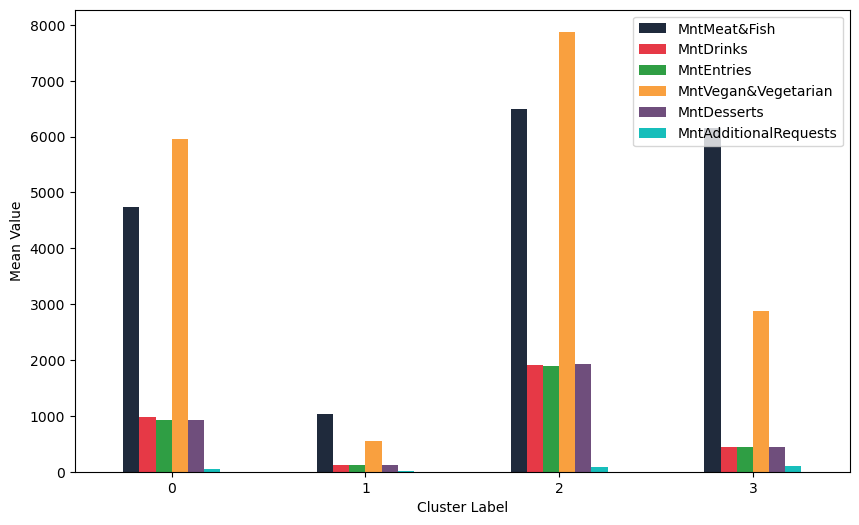

In [21]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_veg_1 = check_veg_1.plot.bar(figsize=(10,6), rot=0, color = colors)
ax_veg_1.set_xlabel('Cluster Label')
ax_veg_1.set_ylabel('Mean Value')
plt.show()

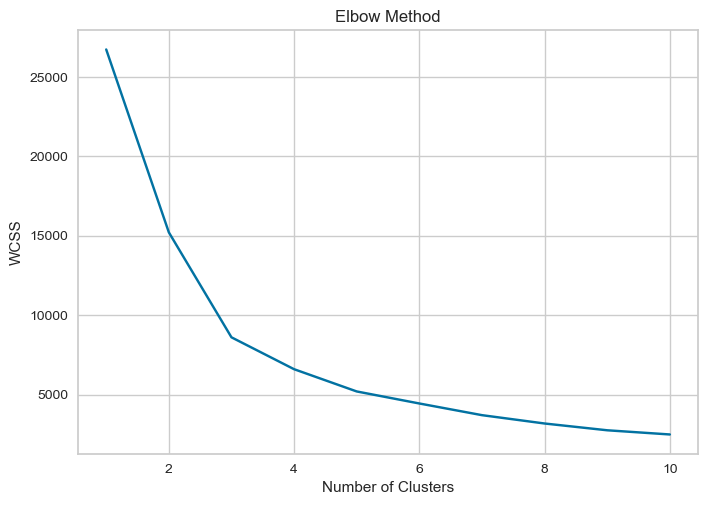

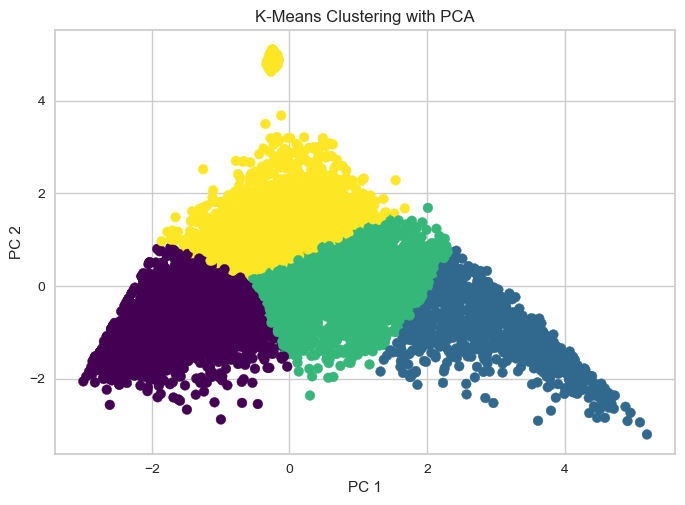

,Score
Silhouette Score,0.232057
Calinski-Harabasz Index,2148.941995
WCSS,6609.178095
Davies-Bouldin Index,1.679851


In [164]:
foods_scaled_4 = scaler.fit_transform(foods_perc)

pca = PCA(n_components=2)
foods_pca = pca.fit_transform(foods_scaled_4)

# Step 2: Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(foods_pca)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Step 3: Apply K-Means clustering with the optimal number of clusters (e.g. 3)
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=3000, random_state=0)
kmeans.fit(foods_pca)

# Step 4: Plot the results
plt.scatter(foods_pca[:,0], foods_pca[:,1], c=kmeans.labels_, cmap='viridis')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('K-Means Clustering with PCA')
plt.show()


cluster_scores(foods_scaled_4,kmeans.labels_,kmeans)

We see that there is that blob there... its likely to be result of our Vegans, lets take care of that and check back.

In [78]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate WCSS
wcss = kmeans.inertia_

# Calculate Silhouette score
silhouette = silhouette_score(foods_pca, kmeans.labels_)

# Calculate Calinski-Harabasz Index
ch = calinski_harabasz_score(foods_pca, kmeans.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", ch)

WCSS:  6609.178095015977
Silhouette Score:  0.40282082735852826
Calinski-Harabasz Index:  7099.785143297635


In [23]:
food_perc_labeled = foods_perc.copy()

In [24]:
food_perc_labeled['cluster'] = kmeans.labels_


In [25]:
food_perc_labeled

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests,cluster
0,0.265805,0.143678,0.071839,0.474138,0.043103,0.001437,3
1,0.436467,0.063017,0.015496,0.452479,0.030992,0.001550,3
2,0.206795,0.000000,0.236337,0.221566,0.295421,0.039882,1
3,0.455753,0.090808,0.150775,0.215883,0.075388,0.011394,2
4,0.459086,0.061576,0.076628,0.326355,0.061576,0.014778,2
...,...,...,...,...,...,...,...
7003,0.551431,0.047084,0.079681,0.255342,0.063383,0.003079,0
7004,0.290160,0.014017,0.155593,0.381623,0.155593,0.003014,2
7005,0.489861,0.079958,0.031790,0.301286,0.096334,0.000771,0
7006,0.401117,0.191348,0.000000,0.379724,0.024364,0.003447,3


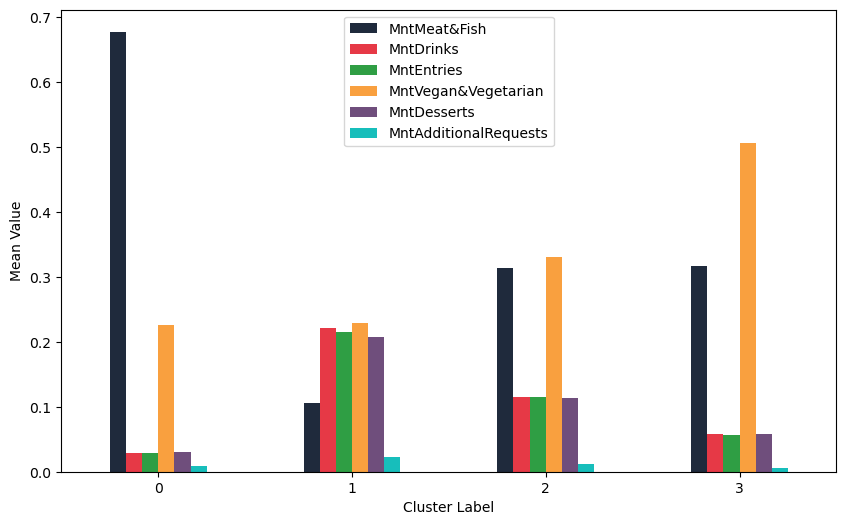

In [26]:
check_veg_2 = food_perc_labeled.groupby(['cluster']).mean()
check_veg_2

ax_veg_2 = check_veg_2.plot.bar(figsize=(10,6), rot=0, color = colors)
ax_veg_2.set_xlabel('Cluster Label')
ax_veg_2.set_ylabel('Mean Value')
plt.show()

In [27]:
## For the food_set
mask = food_set['MntVegan&Vegetarian'] < 20000
food_set_noveg = food_set[mask]

##For the food_perc
mask = foods_perc['MntVegan&Vegetarian'] < 0.9
food_perc_noveg = foods_perc[mask]


Lets Run them again

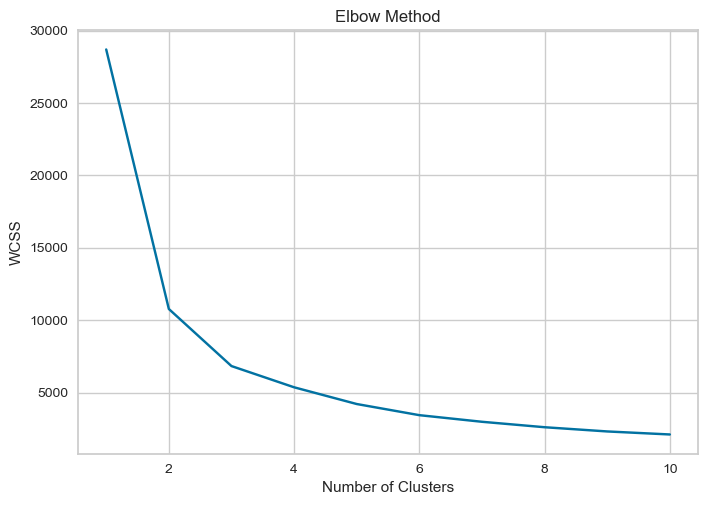

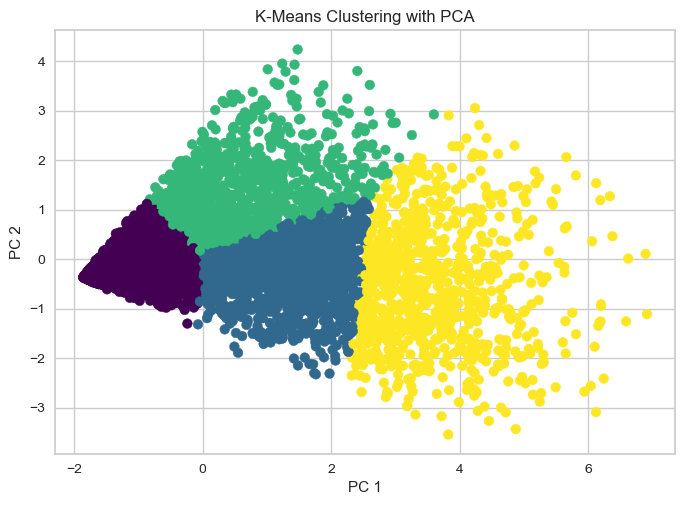

,Score
Silhouette Score,0.431268
Calinski-Harabasz Index,2975.494249
WCSS,5377.101034
Davies-Bouldin Index,1.785949


In [165]:
## For the not scaled
foods_scaled_5 = scaler.fit_transform(food_set_noveg)

pca = PCA(n_components=2)
foods_pca = pca.fit_transform(foods_scaled_5)

# Step 2: Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(foods_pca)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Step 3: Apply K-Means clustering with the optimal number of clusters (e.g. 3)
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=3000, random_state=0)
kmeans.fit(foods_pca)

# Step 4: Plot the results
plt.scatter(foods_pca[:,0], foods_pca[:,1], c=kmeans.labels_, cmap='viridis')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('K-Means Clustering with PCA')
plt.show()

cluster_scores(foods_scaled_5,kmeans.labels_,kmeans)

In [82]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate WCSS
wcss = kmeans.inertia_

# Calculate Silhouette score
silhouette = silhouette_score(foods_pca, kmeans.labels_)

# Calculate Calinski-Harabasz Index
ch = calinski_harabasz_score(foods_pca, kmeans.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", ch)

WCSS:  5377.101034086125
Silhouette Score:  0.5476489317960589
Calinski-Harabasz Index:  10022.114713322377


In [29]:
food_set_noveg_labeled = food_set_noveg.copy()
food_set_noveg_labeled['cluster'] = kmeans.labels_



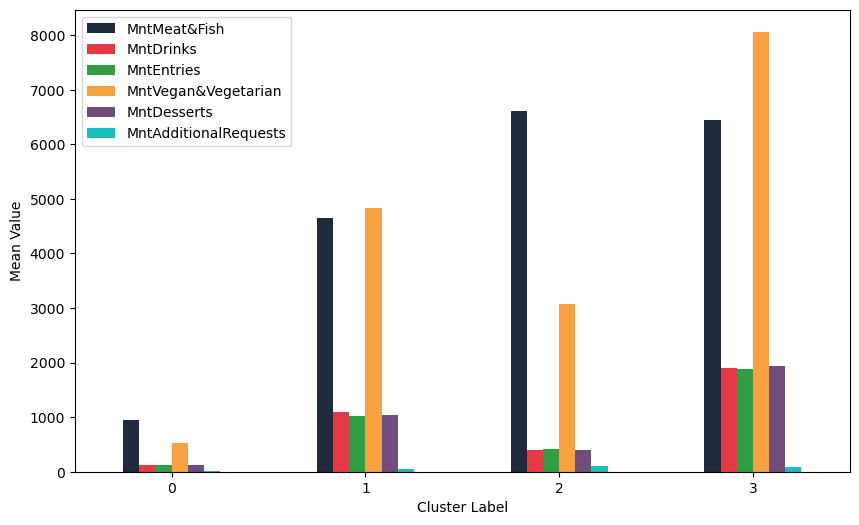

In [30]:
check_noveg_1 = food_set_noveg_labeled.groupby(['cluster']).mean()
check_noveg_1

ax_noveg_1 = check_noveg_1.plot.bar(figsize=(10,6), rot=0, color = colors)
ax_noveg_1.set_xlabel('Cluster Label')
ax_noveg_1.set_ylabel('Mean Value')
plt.show()

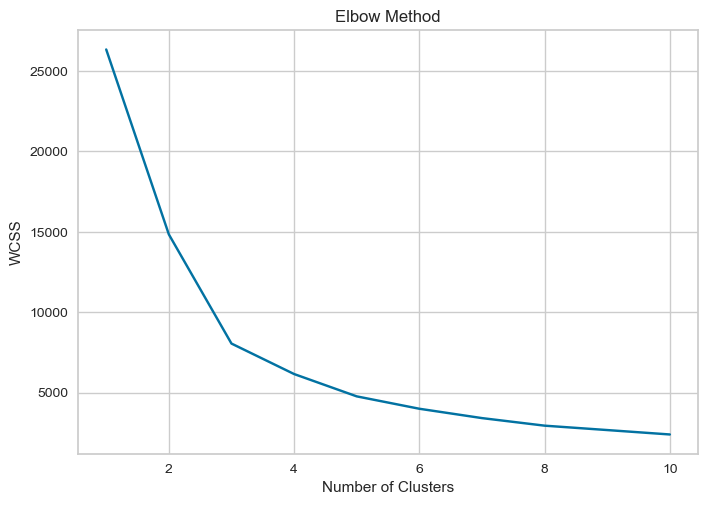

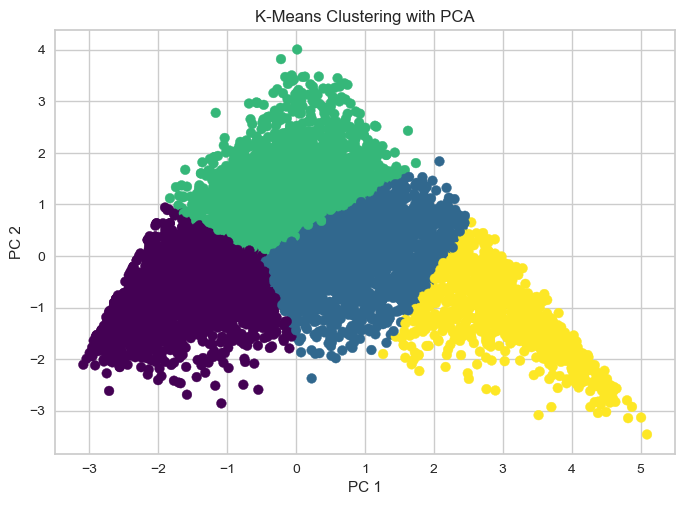

,Score
Silhouette Score,0.235832
Calinski-Harabasz Index,2179.714606
WCSS,6164.743273
Davies-Bouldin Index,1.704065


In [166]:

foods_scaled_6 = scaler.fit_transform(food_perc_noveg)

pca = PCA(n_components=2)
foods_pca = pca.fit_transform(foods_scaled_6)

# Step 2: Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(foods_pca)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

# Step 3: Apply K-Means clustering with the optimal number of clusters (e.g. 3)
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=3000, random_state=0)
kmeans.fit(foods_pca)

# Step 4: Plot the results
plt.scatter(foods_pca[:,0], foods_pca[:,1], c=kmeans.labels_, cmap='viridis')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('K-Means Clustering with PCA')
plt.show()

cluster_scores(foods_scaled_6,kmeans.labels_,kmeans)

In [84]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate WCSS
wcss = kmeans.inertia_

# Calculate Silhouette score
silhouette = silhouette_score(foods_pca, kmeans.labels_)

# Calculate Calinski-Harabasz Index
ch = calinski_harabasz_score(foods_pca, kmeans.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", ch)

WCSS:  6164.74327262213
Silhouette Score:  0.4065027002250347
Calinski-Harabasz Index:  7564.046444751868


Perfect its looking a lot better

In [32]:
food_perc_noveg_labeled = food_perc_noveg.copy()
food_perc_noveg_labeled['cluster'] = kmeans.labels_

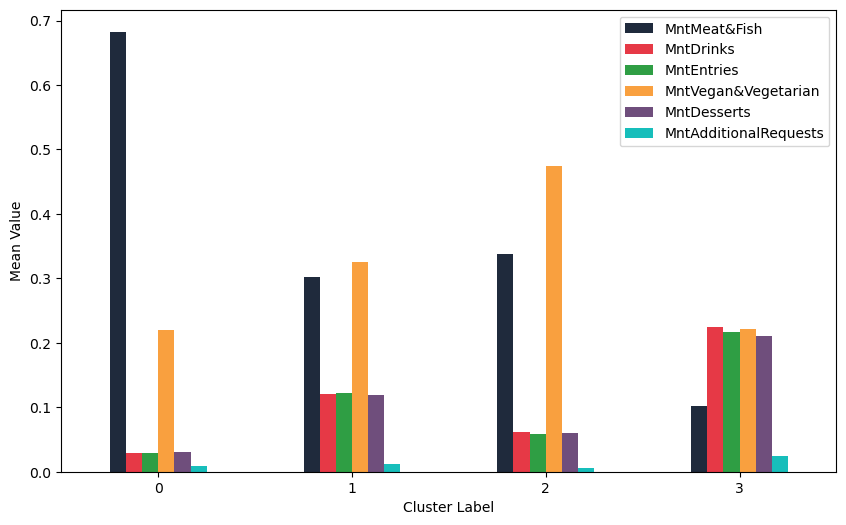

In [33]:
check_noveg_2 = food_perc_noveg_labeled.groupby(['cluster']).mean()
check_noveg_2

ax_noveg_2 = check_noveg_2.plot.bar(figsize=(10,6), rot=0, color = colors)
ax_noveg_2.set_xlabel('Cluster Label')
ax_noveg_2.set_ylabel('Mean Value')
plt.show()

**PCA ones:**

- Cluster 0: Very High Meat&Fish, Medium Vegan, Low everything else
- Cluster 1: Medium Fish and Vegan, Medium/low everything else
- Cluster 2: Higher Vegan, Medium/High Meat and Fish, Low everything else
- Cluster 4: Medium everything except additional requests

So basically we have
Cluster 0 : High Meat&Fish, Medium Vegan, Low everything else
Cluster 1: Medium Fish and Vegan, medium everything else
Cluster 2: Higher Vegan, High Meat and Fish, low everything else
Cluster 4: Medium everything except additional requests

### Without PCA

In [34]:
foods

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
0,5180.0,2800.0,1400,9240.0,840.0,28.0
1,8450.0,1220.0,300,8760.0,600.0,30.0
2,140.0,0.0,160,150.0,200.0,27.0
3,5320.0,1060.0,1760,2520.0,880.0,133.0
4,6710.0,900.0,1120,4770.0,900.0,216.0
...,...,...,...,...,...,...
7003,6090.0,520.0,880,2820.0,700.0,34.0
7004,4140.0,200.0,2220,5445.0,2220.0,43.0
7005,10170.0,1660.0,660,6255.0,2000.0,16.0
7006,6750.0,3220.0,0,6390.0,410.0,58.0


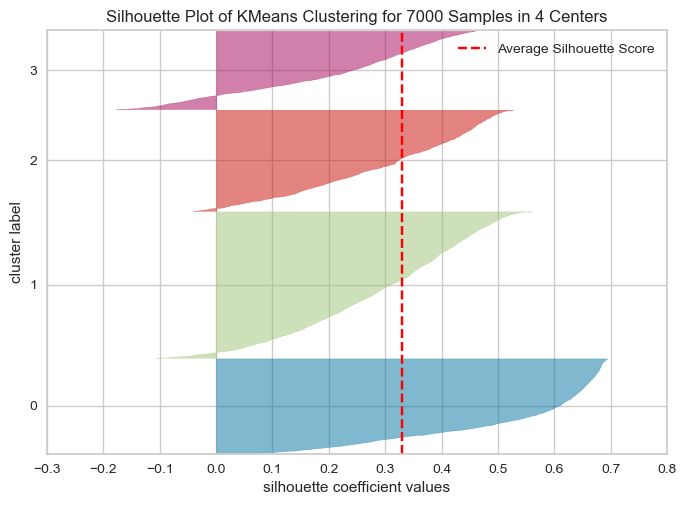

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 7000 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [35]:
from yellowbrick.cluster import SilhouetteVisualizer

X = foods_perc.copy()

# Specify the features to use for clustering
features = ['MntMeat&Fish',	'MntDrinks','MntEntries','MntVegan&Vegetarian',	'MntDesserts', 'MntAdditionalRequests']


# Instantiate the clustering model and visualizer
model = KMeans(4, init='k-means++', random_state= 50)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()

## Looking Pretty good

###### KMEANS 3 - with Vegan Outliers

,Score
Silhouette Score,0.369431
Calinski-Harabasz Index,5479.286276
WCSS,277.141732
Davies-Bouldin Index,1.090430


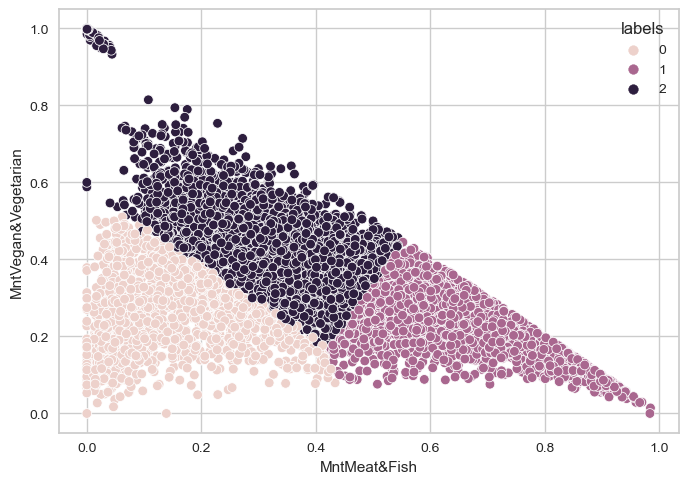

In [167]:
from sklearn.cluster import KMeans
food_model_perc_k3 = foods_perc.copy()
model_perc_k3 = KMeans(n_clusters = 3, random_state = 100).fit(foods_perc)
food_model_perc_k3['labels']= model_perc_k3.labels_

##centroids = model_k3_2.cluster_centers_
sns.scatterplot(data= food_model_perc_k3, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')

cluster_scores(foods_perc,model_perc_k3.labels_,model_perc_k3)

In [85]:
wcss = model_perc_k3.inertia_
silhouette = silhouette_score(foods_perc, model_perc_k3.labels_)
calinski = calinski_harabasz_score(foods_perc, model_perc_k3.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", calinski)

WCSS:  277.14173239216575
Silhouette Score:  0.3694307240406272
Calinski-Harabasz Index:  5479.2862757149


In [37]:
fmpk3 = food_model_perc_k3.groupby(['labels']).mean()
fmpk3

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.147349,0.196141,0.196595,0.258043,0.185056,0.017671
1,0.666807,0.033712,0.033190,0.223150,0.034362,0.008990
2,0.323860,0.074416,0.072604,0.445228,0.075106,0.009175


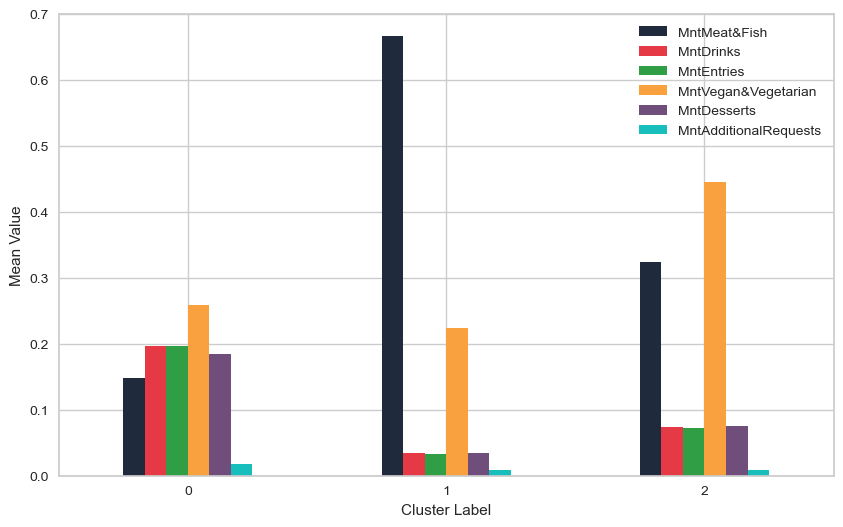

In [38]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_k3 = fmpk3.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_k3.set_xlabel('Cluster Label')
ax_k3.set_ylabel('Mean Value')
plt.show()

**Now:**

- Cluster 0:  Everything Medium, except additional requests
- Cluster 1: Very High Meat, Medium Vegan, Low rest
- Cluster 2: Higher Vegan, Medium Vegan, Low rest

###### KMEANS 4 - with Vegan Outliers

,Score
Silhouette Score,0.330325
Calinski-Harabasz Index,5294.330470
WCSS,217.471255
Davies-Bouldin Index,1.020659


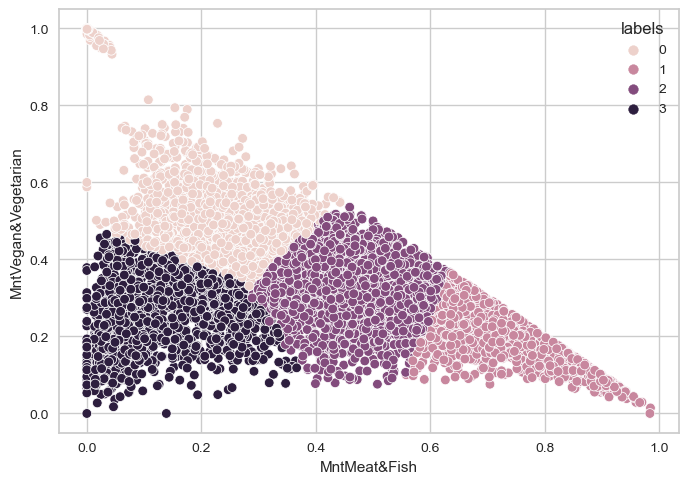

In [168]:
from sklearn.cluster import KMeans
food_model_perc_k4 = foods_perc.copy()
model_perc_k4 = KMeans(n_clusters = 4, random_state = 100).fit(foods_perc)
food_model_perc_k4['labels']= model_perc_k4.labels_

##centroids = model_k3_2.cluster_centers_
sns.scatterplot(data= food_model_perc_k4, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')

cluster_scores(foods_perc,model_perc_k4.labels_,model_perc_k4)

In [91]:
wcss = model_perc_k4.inertia_
silhouette = silhouette_score(foods_perc, model_perc_k4.labels_)
calinski = calinski_harabasz_score(foods_perc, model_perc_k4.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", calinski)

WCSS:  217.47125461705724
Silhouette Score:  0.3303247249944983
Calinski-Harabasz Index:  5294.330470248665


In [40]:
fmpk4 = food_model_perc_k4.groupby(['labels']).mean()
fmpk4

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.238657,0.079653,0.078415,0.516004,0.078066,0.009417
1,0.740537,0.020427,0.020984,0.187331,0.022124,0.008817
2,0.462951,0.067472,0.065542,0.326848,0.068346,0.009259
3,0.138133,0.200746,0.200516,0.253610,0.189848,0.018083


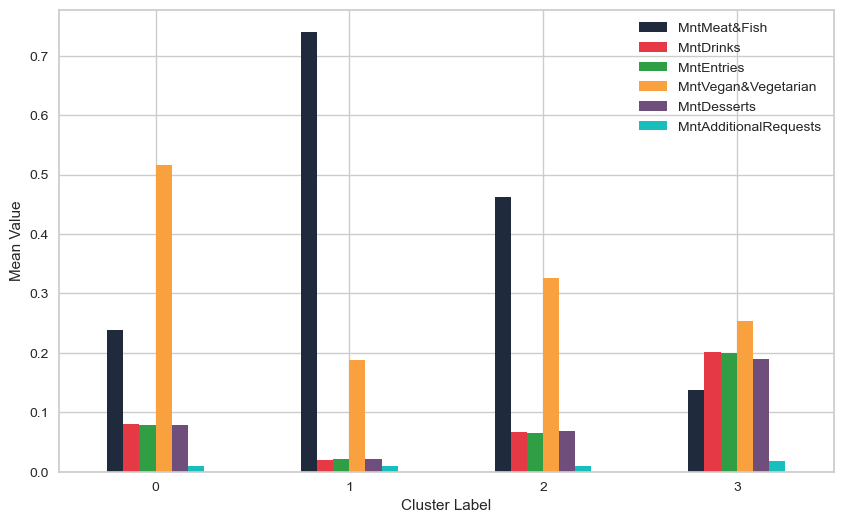

In [41]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_k4 = fmpk4.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_k4.set_xlabel('Cluster Label')
ax_k4.set_ylabel('Mean Value')
plt.show()

**PCA ones:**

- Cluster 0: Very High Meat&Fish, Medium Vegan, Low everything else
- Cluster 1: Medium Fish and Vegan, Medium everything else
- Cluster 2: Higher Vegan, High Meat and Fish, Low everything else
- Cluster 4: Medium everything except additional requests

**Now:**

- Cluster 0: Higher Vegan, Medium Meat, Low rest
- Cluster 1: Very High Meat, Medium Vegan, Low rest
- Cluster 2: High Meat, High Vegan, Low rest
- Cluster 3: Everything Medium, except additional requests

###### KMEANS 3 - without Vegan Outliers

,Score
Silhouette Score,0.372958
Calinski-Harabasz Index,5823.980565
WCSS,250.866395
Davies-Bouldin Index,1.077055


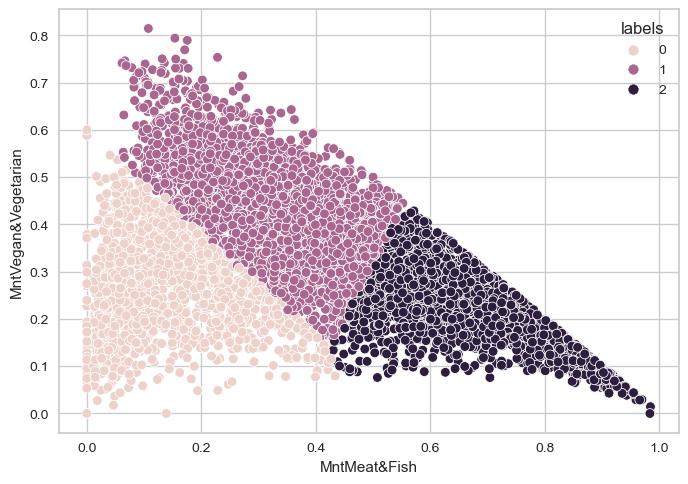

In [170]:
from sklearn.cluster import KMeans
food_model_perc_noveg_k3 = food_perc_noveg.copy()
model_perc__noveg_k3 = KMeans(n_clusters = 3, random_state = 100).fit(food_model_perc_noveg_k3)
food_model_perc_noveg_k3['labels']= model_perc__noveg_k3.labels_

##centroids = model_k3_2.cluster_centers_
sns.scatterplot(data= food_model_perc_noveg_k3, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')

cluster_scores(food_perc_noveg,model_perc__noveg_k3.labels_,model_perc__noveg_k3)

In [92]:
wcss = model_perc__noveg_k3.inertia_
silhouette = silhouette_score(food_perc_noveg,  model_perc__noveg_k3.labels_)
calinski = calinski_harabasz_score(food_perc_noveg, model_perc__noveg_k3.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", calinski)

WCSS:  250.8663952338781
Silhouette Score:  0.3729582920203378
Calinski-Harabasz Index:  5823.980564716524


In [43]:
fmpnvk3 = food_model_perc_noveg_k3.groupby(['labels']).mean()
fmpnvk3

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.142459,0.197346,0.196890,0.259910,0.186546,0.017717
1,0.335019,0.076454,0.074778,0.428126,0.076633,0.009375
2,0.672620,0.032219,0.032069,0.221037,0.033253,0.009019


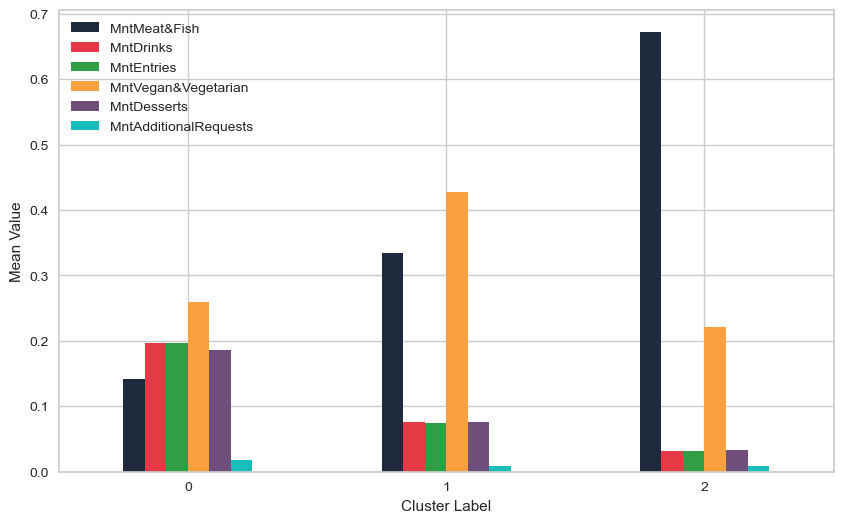

In [44]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_nv_k3 = fmpnvk3.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_nv_k3.set_xlabel('Cluster Label')
ax_nv_k3.set_ylabel('Mean Value')
plt.show()

###### KMEANS 4 - without Vegan Outliers

,Score
Silhouette Score,0.328103
Calinski-Harabasz Index,5534.724099
WCSS,198.023504
Davies-Bouldin Index,1.035682


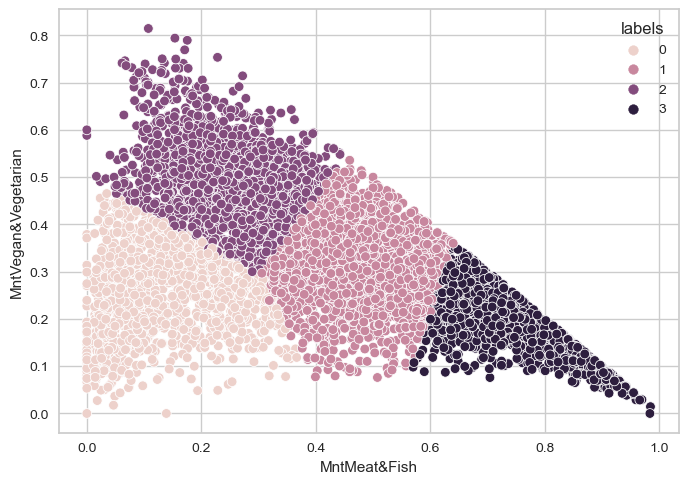

In [172]:
from sklearn.cluster import KMeans
food_model_perc_noveg_k4 = food_perc_noveg.copy()
model_perc__noveg_k4 = KMeans(n_clusters = 4, random_state = 100).fit(food_model_perc_noveg_k4)
food_model_perc_noveg_k4['labels']= model_perc__noveg_k4.labels_


##centroids = model_k3_2.cluster_centers_
sns.scatterplot(data= food_model_perc_noveg_k4, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(food_perc_noveg,model_perc__noveg_k4.labels_,model_perc__noveg_k4)

In [174]:
wcss = model_perc__noveg_k4.inertia_
silhouette = silhouette_score(food_perc_noveg,  model_perc__noveg_k4.labels_)
calinski = calinski_harabasz_score(food_perc_noveg, model_perc__noveg_k4.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", calinski)

WCSS:  198.02350436114094
Silhouette Score:  0.3281025905637994
Calinski-Harabasz Index:  5534.7240994583035


In [46]:
fmpnvk4 = food_model_perc_noveg_k4.groupby(['labels']).mean()
fmpnvk4

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.135346,0.203392,0.202453,0.248518,0.193074,0.018192
1,0.475869,0.066036,0.064092,0.319874,0.065428,0.009140
2,0.255739,0.083825,0.083263,0.483824,0.083600,0.009942
3,0.746355,0.019368,0.019720,0.184745,0.021122,0.008919


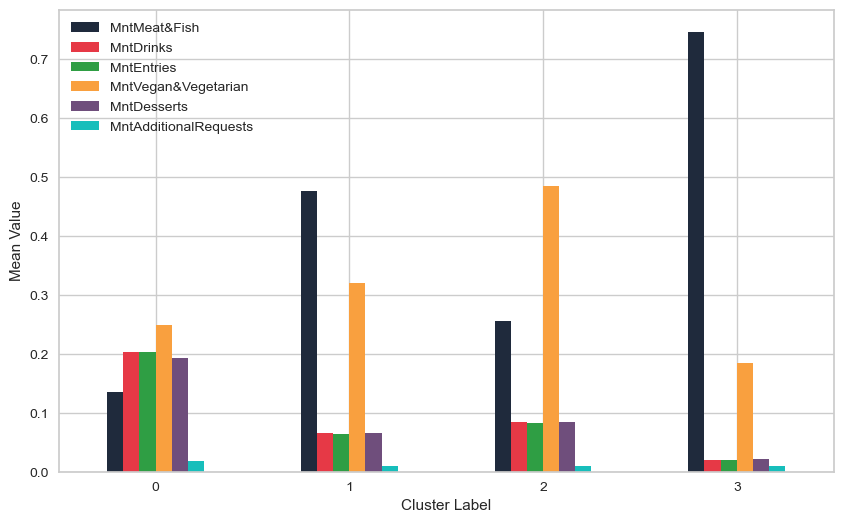

In [47]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_nv_k4 = fmpnvk4.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_nv_k4.set_xlabel('Cluster Label')
ax_nv_k4.set_ylabel('Mean Value')
plt.show()

###### KMEANS ++  5 - without Vegan Outliers 

,Score
Silhouette Score,0.301267
Calinski-Harabasz Index,4886.584536
WCSS,176.003027
Davies-Bouldin Index,1.154593


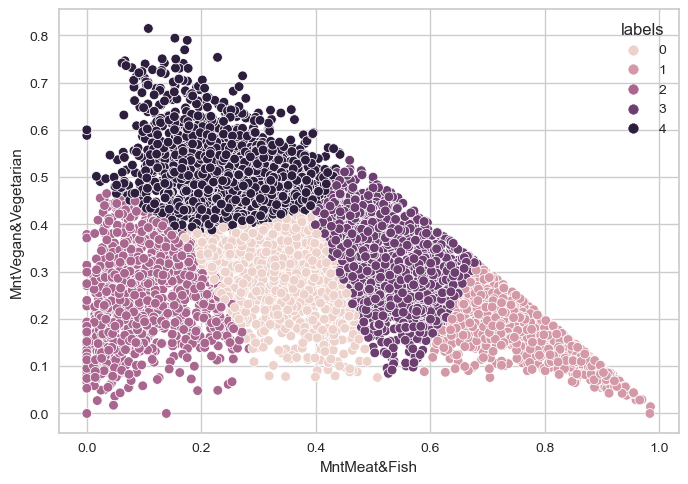

In [175]:
from sklearn.cluster import KMeans
food_model_perc_noveg_k5_ = food_perc_noveg.copy()
model_perc_noveg_k5_ = KMeans(n_clusters = 5, init='k-means++', random_state = 100).fit(food_model_perc_noveg_k5_)
food_model_perc_noveg_k5_['labels']= model_perc_noveg_k5_.labels_

sns.scatterplot(data= food_model_perc_noveg_k5_, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(food_perc_noveg,model_perc_noveg_k5_.labels_,model_perc_noveg_k5_)

In [97]:
wcss = model_perc_noveg_k5_.inertia_
silhouette = silhouette_score(food_perc_noveg,  model_perc_noveg_k5_.labels_)
calinski = calinski_harabasz_score(food_perc_noveg, model_perc_noveg_k5_.labels_)

print("WCSS: ", wcss)
print("Silhouette Score: ", silhouette)
print("Calinski-Harabasz Index: ", calinski)

WCSS:  176.00302679504253
Silhouette Score:  0.301266999746617
Calinski-Harabasz Index:  4886.584536062526


In [49]:
fmpik5 = food_model_perc_noveg_k5_.groupby(['labels']).mean()
fmpik5

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.341393,0.113879,0.116167,0.303922,0.115383,0.010060
1,0.767389,0.017393,0.018128,0.169789,0.018575,0.008808
2,0.102682,0.217954,0.211536,0.246430,0.202627,0.019680
3,0.531396,0.045971,0.044646,0.322562,0.046525,0.009192
4,0.250421,0.077821,0.077049,0.508040,0.077118,0.009783


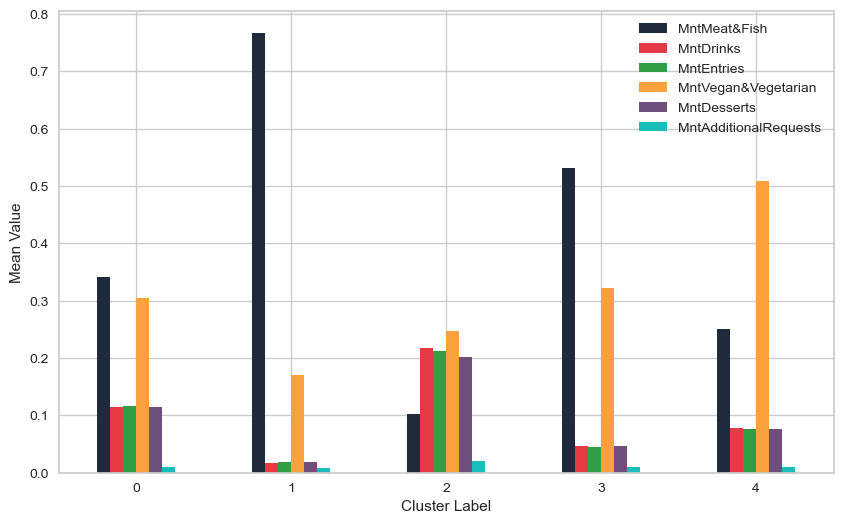

In [50]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_nv_k5_ = fmpik5.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_nv_k5_.set_xlabel('Cluster Label')
ax_nv_k5_.set_ylabel('Mean Value')
plt.show()

###### KMEANS ++  4 - without Vegan Outliers 

In [158]:
cluster_scores(food_perc_noveg, food_model_perc_noveg_k4_['labels'],model_perc_noveg_k4_)

,Score
Silhouette Score,0.328103
Calinski-Harabasz Index,5534.724099
WCSS,198.023504
Davies-Bouldin Index,1.035682


,Score
Silhouette Score,0.328063
Calinski-Harabasz Index,5534.725791
WCSS,198.023462
Davies-Bouldin Index,1.035824


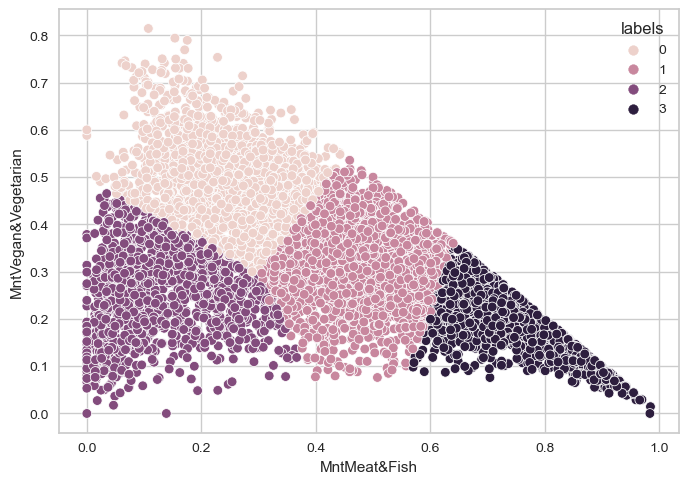

In [182]:
from sklearn.cluster import KMeans
food_model_perc_noveg_k4_ = food_perc_noveg.copy()
model_perc_noveg_k4_ = KMeans(n_clusters = 4, init='k-means++', max_iter = 100000).fit(food_model_perc_noveg_k4_)
food_model_perc_noveg_k4_['labels']= model_perc_noveg_k4_.labels_

sns.scatterplot(data= food_model_perc_noveg_k4_, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(food_perc_noveg,model_perc_noveg_k4_.labels_,model_perc_noveg_k4_)

In [179]:
cluster_scores(food_perc_noveg, food_model_perc_noveg_k3_['labels'])

TypeError: cluster_scores() missing 1 required positional argument: 'model'

In [52]:
fmpik4 = food_model_perc_noveg_k4_.groupby(['labels']).mean()
fmpik4

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.135346,0.203392,0.202453,0.248518,0.193074,0.018192
1,0.475869,0.066036,0.064092,0.319874,0.065428,0.009140
2,0.255739,0.083825,0.083263,0.483824,0.083600,0.009942
3,0.746355,0.019368,0.019720,0.184745,0.021122,0.008919


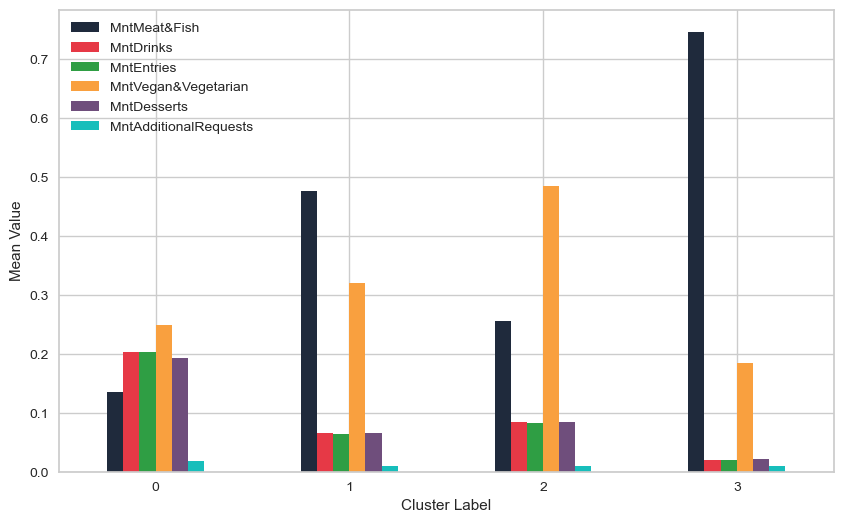

In [53]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_nv_k4_ = fmpik4.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_nv_k4_.set_xlabel('Cluster Label')
ax_nv_k4_.set_ylabel('Mean Value')
plt.show()

###### KMEANS ++  3 - without Vegan Outliers 

,Score
Silhouette Score,0.372908
Calinski-Harabasz Index,5823.998024
WCSS,250.865741
Davies-Bouldin Index,1.076919


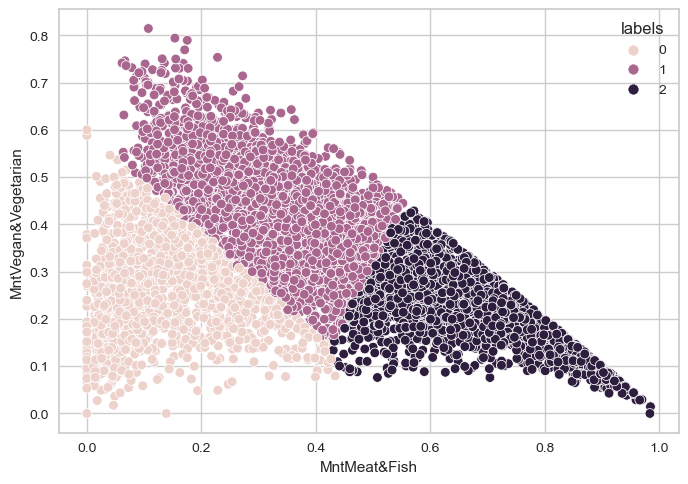

In [183]:
from sklearn.cluster import KMeans
food_model_perc_noveg_k3_ = food_perc_noveg.copy()
model_perc_noveg_k3_ = KMeans(n_clusters = 3, init='k-means++').fit(food_model_perc_noveg_k3_)
food_model_perc_noveg_k3_['labels']= model_perc_noveg_k3_.labels_

sns.scatterplot(data= food_model_perc_noveg_k3_, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(food_perc_noveg,model_perc_noveg_k3_.labels_,model_perc_noveg_k3_)


In [223]:
food_model_perc_noveg_k4_['labels'].value_counts()

1    2322
0    1852
3    1516
2    1247
Name: labels, dtype: int64

<AxesSubplot:xlabel='MntMeat&Fish', ylabel='MntDesserts'>

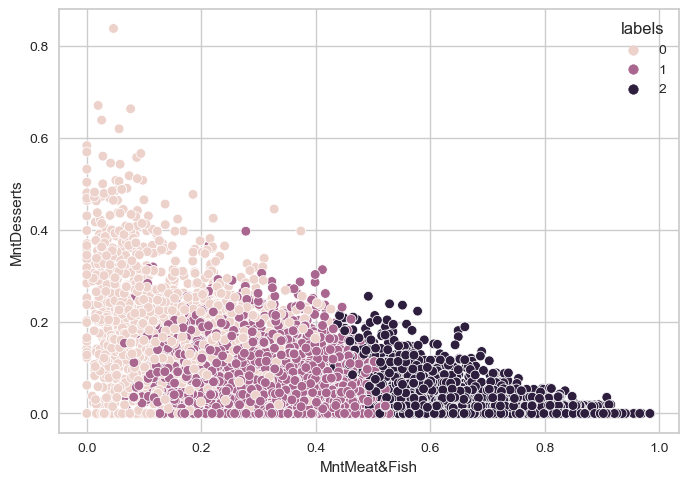

In [55]:
sns.scatterplot(data= food_model_perc_noveg_k3_, x='MntMeat&Fish', y='MntDesserts', hue='labels')

In [56]:
fmpik3 = food_model_perc_noveg_k3_.groupby(['labels']).mean()
fmpik3

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.142459,0.197346,0.196890,0.259910,0.186546,0.017717
1,0.335019,0.076454,0.074778,0.428126,0.076633,0.009375
2,0.672620,0.032219,0.032069,0.221037,0.033253,0.009019


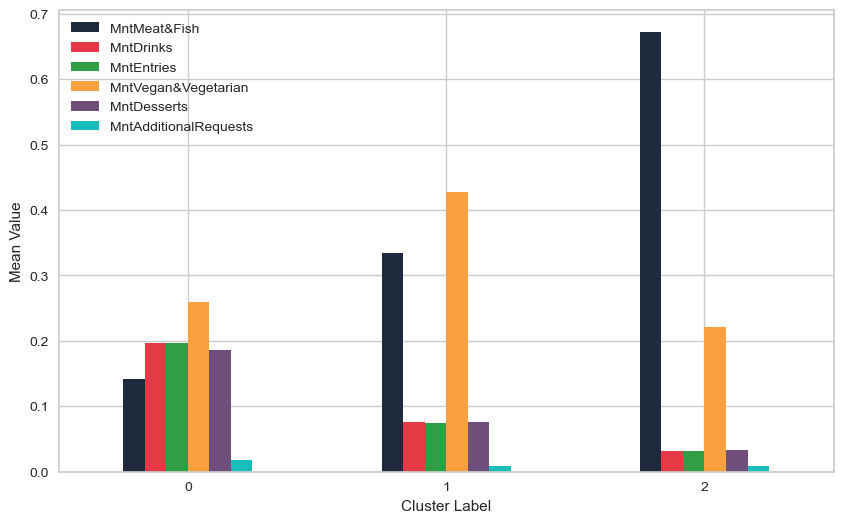

In [57]:
colors =  ['#1F2A3C', '#E63946', '#2F9E44', '#F9A03F', '#6F4E7C', '#17BEBB']
ax_nv_k3_ = fmpik3.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_nv_k3_.set_xlabel('Cluster Label')
ax_nv_k3_.set_ylabel('Mean Value')
plt.show()

## Min-Max Scaling

In [186]:
foods_norm = ((food_set - food_set.min())/ food_set.max() - food_set.min())
foods_norm

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7000 entries, 0 to 7007
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   MntMeat&Fish           7000 non-null   float64
 1   MntDrinks              7000 non-null   float64
 2   MntEntries             7000 non-null   float64
 3   MntVegan&Vegetarian    7000 non-null   float64
 4   MntDesserts            7000 non-null   float64
 5   MntAdditionalRequests  7000 non-null   float64
dtypes: float64(6)
memory usage: 382.8 KB


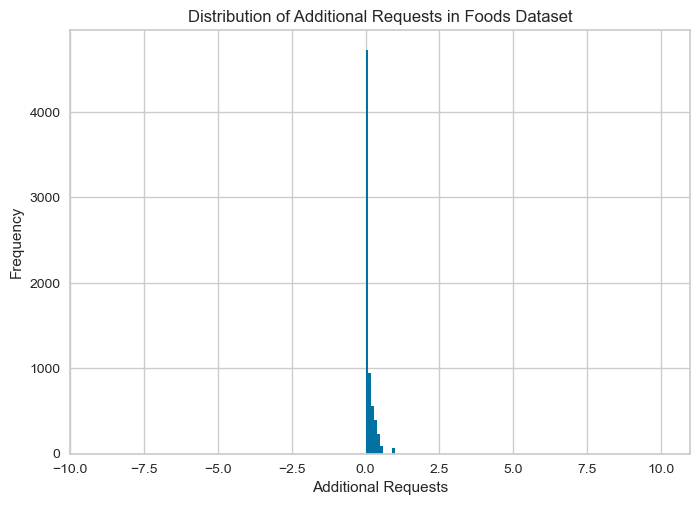

In [187]:
mnt_requests = foods_norm["MntVegan&Vegetarian"]
plt.hist(mnt_requests, bins=10)
# Add axis labels and a title
plt.xlabel("Additional Requests")
plt.ylabel("Frequency")
plt.title("Distribution of Additional Requests in Foods Dataset")
padding = 10  # Adjust padding as needed
plt.xlim(mnt_requests.min() - padding, mnt_requests.max() + padding)

# Show the histogram
plt.show()

###### KMEANS ++  3 - with Vegan Outliers 

,Score
Silhouette Score,0.425782
Calinski-Harabasz Index,3592.073151
WCSS,807.670959
Davies-Bouldin Index,1.484898


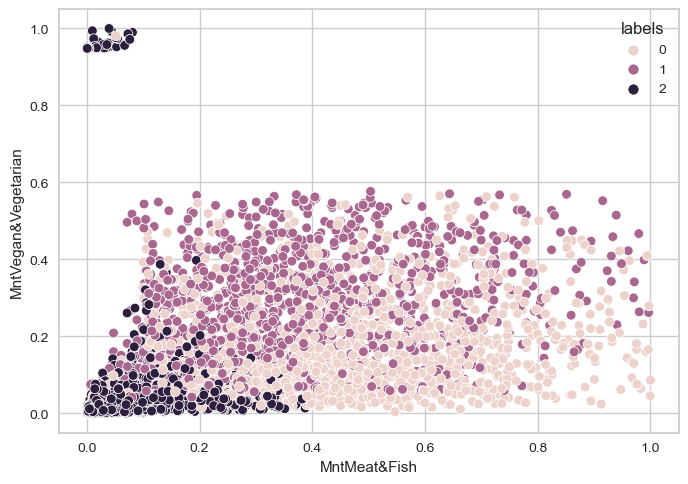

In [188]:
from sklearn.cluster import KMeans
food_norm_k3 = foods_norm.copy()
model_food_norm_k3 = KMeans(n_clusters = 3, init='k-means++', random_state = 100).fit(food_norm_k3)
food_norm_k3['labels']= model_food_norm_k3.labels_

sns.scatterplot(data= food_norm_k3, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(foods_norm,model_food_norm_k3.labels_,model_food_norm_k3)

In [144]:
cluster_scores(foods_norm, food_norm_k3['labels'])

Silhouette Score:  0.4257818616185509
Calinski-Harabasz Index:  3592.0731511950494
WCSS:  MntMeat&Fish             28698.182514
MntDrinks                23267.567600
MntEntries               22214.589437
MntVegan&Vegetarian      12838.434561
MntDesserts              23032.647371
MntAdditionalRequests    22541.036776
dtype: float64
Davies-Bouldin Index:  1.4848976616351417


C:\Users\gonca\AppData\Local\Temp\ipykernel_13540\275287657.py:9: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  wcss = np.sum(np.square(data - np.mean(data, axis=0)[np.newaxis, :]))


In [189]:
fmnk3 = food_norm_k3.groupby(['labels']).mean()
fmnk3

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,0.435013,0.141736,0.142725,0.156365,0.137694,0.279168
1,0.359228,0.442719,0.426694,0.255438,0.440760,0.330858
2,0.057013,0.035398,0.035019,0.037636,0.035171,0.072164


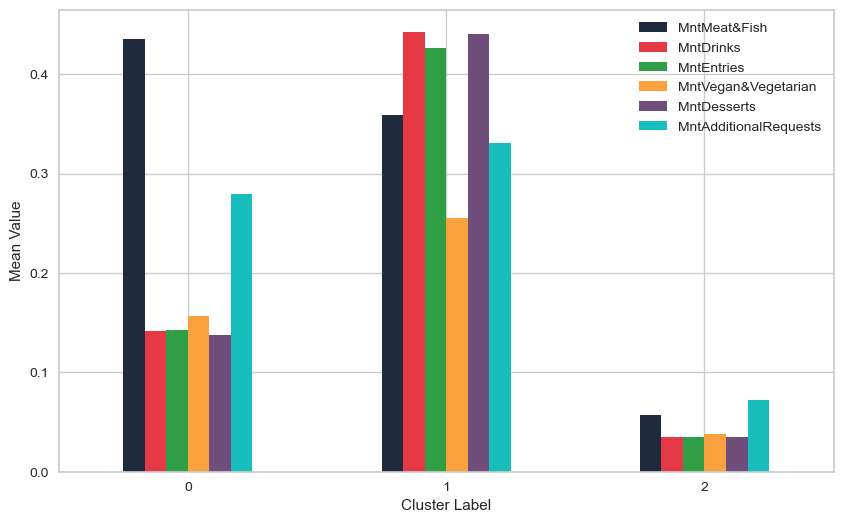

In [190]:
ax_n_k3 = fmnk3.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_n_k3.set_xlabel('Cluster Label')
ax_n_k3.set_ylabel('Mean Value')
plt.show()

###### KMEANS ++  4 - with Vegan Outliers 

,Score
Silhouette Score,0.442408
Calinski-Harabasz Index,2977.893704
WCSS,718.913542
Davies-Bouldin Index,1.390295


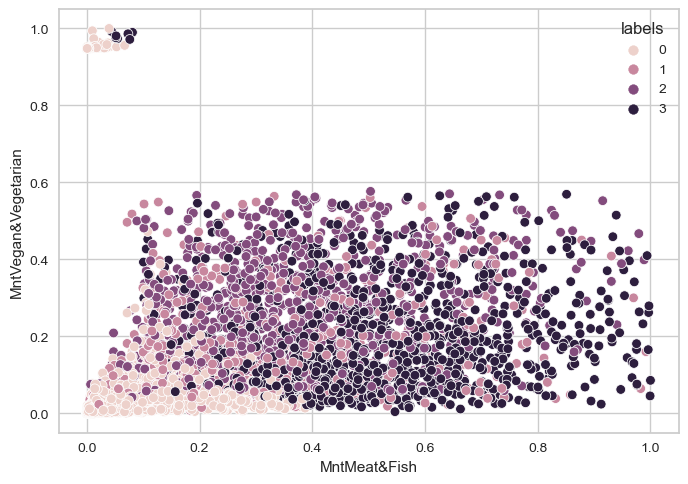

In [192]:
from sklearn.cluster import KMeans
food_norm_k4 = foods_norm.copy()
model_food_norm_k4 = KMeans(n_clusters = 4, init='k-means++', random_state = 100).fit(food_norm_k4)
food_norm_k4['labels']= model_food_norm_k4.labels_

sns.scatterplot(data= food_norm_k4, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(foods_norm,model_food_norm_k4.labels_,model_food_norm_k4)

In [64]:
fmnk4 = food_norm_k4.groupby(['labels']).mean()
fmnk4

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
labels,,,,,,
0,1.531867,1.318221,1.318571,1.328449,1.320032,1.656730
1,3.686169,2.880458,2.688442,2.376163,2.707728,6.382374
2,4.207947,5.167604,5.184100,3.315036,5.328913,3.495196
3,5.443283,2.452810,2.397523,2.669788,2.341882,2.456834


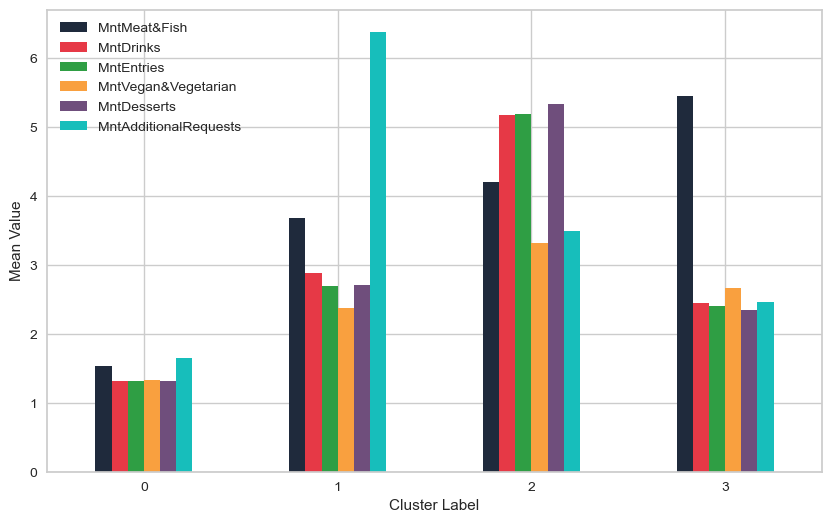

In [193]:
ax_n_k4 = fmnk4.plot.bar(figsize=(10,6), rot=0, color=colors)

ax_n_k4.set_xlabel('Cluster Label')
ax_n_k4.set_ylabel('Mean Value')
plt.show()

###### KMEANS ++  5- with Vegan Outliers 

,Score
Silhouette Score,0.446907
Calinski-Harabasz Index,2634.119877
WCSS,653.134995
Davies-Bouldin Index,1.499775


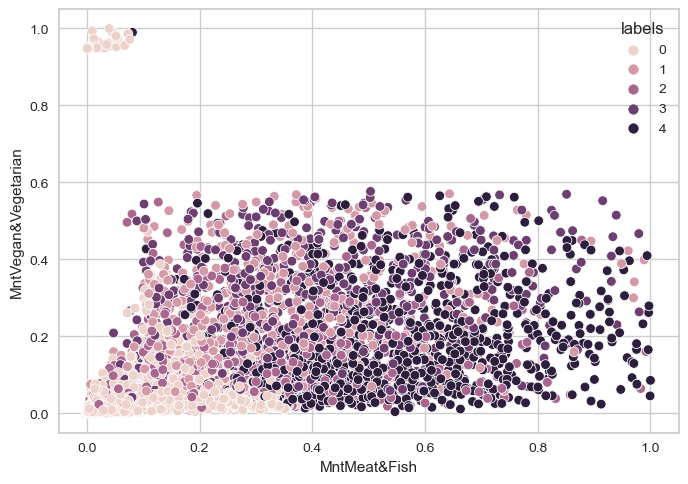

In [194]:
from sklearn.cluster import KMeans
food_norm_k5 = foods_norm.copy()
model_food_norm_k5 = KMeans(n_clusters = 5, init='k-means++', random_state = 100).fit(food_norm_k5)
food_norm_k5['labels']= model_food_norm_k5.labels_

sns.scatterplot(data= food_norm_k5, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(foods_norm,model_food_norm_k5.labels_,model_food_norm_k5)

## Min-Max Scaling - without veg

In [195]:
foods_norm_nvg = ((food_set_noveg - food_set_noveg.min())/ food_set_noveg.max() - food_set_noveg.min())
foods_norm_nvg

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
0,0.345794,0.703518,0.351759,0.616617,0.211055,0.112450
1,0.564085,0.306533,0.075377,0.584585,0.150754,0.120482
2,0.009346,0.000000,0.040201,0.010010,0.050251,0.108434
3,0.355140,0.266332,0.442211,0.168168,0.221106,0.534137
4,0.447931,0.226131,0.281407,0.318318,0.226131,0.867470
...,...,...,...,...,...,...
7003,0.406542,0.130653,0.221106,0.188188,0.175879,0.136546
7004,0.276368,0.050251,0.557789,0.363363,0.557789,0.172691
7005,0.678905,0.417085,0.165829,0.417417,0.502513,0.064257
7006,0.450601,0.809045,0.000000,0.426426,0.103015,0.232932


,Score
Silhouette Score,0.447699
Calinski-Harabasz Index,3177.968991
WCSS,762.139946
Davies-Bouldin Index,1.408772


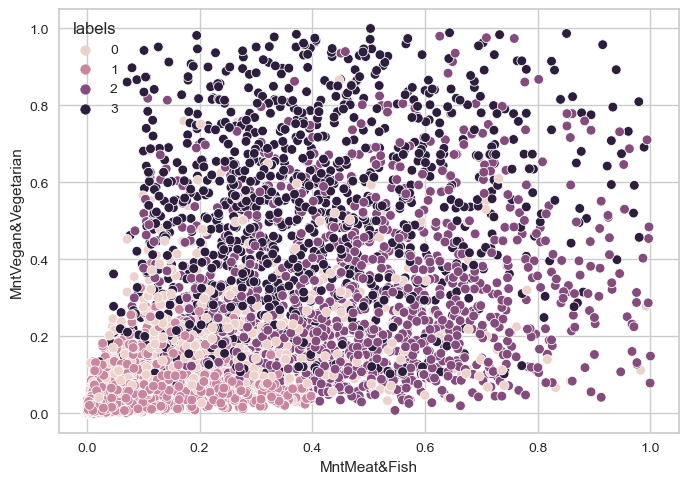

In [196]:
from sklearn.cluster import KMeans
foods_norm_nvg_k4 = foods_norm_nvg.copy()
model_foods_norm_nvg_k4 = KMeans(n_clusters = 4, init='k-means++', random_state = 100).fit(foods_norm_nvg_k4)
foods_norm_nvg_k4['labels']= model_foods_norm_nvg_k4.labels_

sns.scatterplot(data= foods_norm_nvg_k4, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='labels')
cluster_scores(foods_norm_nvg,model_foods_norm_nvg_k4.labels_,model_foods_norm_nvg_k4)

In [220]:
counts = foods_norm_nvg_k4['labels'].value_counts()
counts

1    3871
2    1192
3    1138
0     736
Name: labels, dtype: int64

# **Testing out other stuff**

### **AgglomerativeClustering**

In [145]:
from sklearn.cluster import AgglomerativeClustering
cluster_model = AgglomerativeClustering(n_clusters=4, linkage='ward')

# fit the model to your data
cluster_labels = cluster_model.fit_predict(food_set)

# the output of fit_predict is an array of cluster labels
# you can assign these labels back to your original dataframe
food_set_test2 = food_set.copy()
food_set_test2['cluster_labels'] = cluster_labels


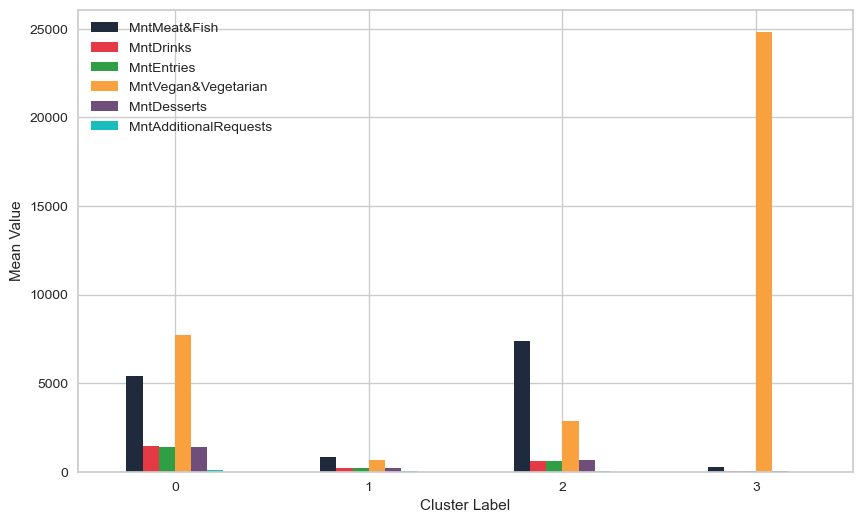

In [146]:
means_2 = food_set_test2.groupby('cluster_labels').mean()
means_2
aglo_2 = means.plot.bar(figsize=(10,6), rot=0, color=colors)

aglo_2.set_xlabel('Cluster Label')
aglo_2.set_ylabel('Mean Value')
plt.show()
cluster_scores(foods_norm_nvg,model_foods_norm_nvg_k4.labels_,model_foods_norm_nvg_k4)

In [69]:
from sklearn.cluster import AgglomerativeClustering
cluster_model = AgglomerativeClustering(n_clusters=5, linkage='ward')

# fit the model to your data
cluster_labels = cluster_model.fit_predict(food_set)

# the output of fit_predict is an array of cluster labels
# you can assign these labels back to your original dataframe
food_set_test1 = food_set.copy()
food_set_test1['cluster_labels'] = cluster_labels

In [ ]:
counts = test232['cluster_labels'].value_counts()
counts

In [70]:
food_set_test1

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests,cluster_labels
0,5180.0,2800.0,1400,9240.0,840.0,28.0,2
1,8450.0,1220.0,300,8760.0,600.0,30.0,4
2,140.0,0.0,160,150.0,200.0,27.0,1
3,5320.0,1060.0,1760,2520.0,880.0,133.0,0
4,6710.0,900.0,1120,4770.0,900.0,216.0,0
...,...,...,...,...,...,...,...
7003,6090.0,520.0,880,2820.0,700.0,34.0,0
7004,4140.0,200.0,2220,5445.0,2220.0,43.0,2
7005,10170.0,1660.0,660,6255.0,2000.0,16.0,0
7006,6750.0,3220.0,0,6390.0,410.0,58.0,2


In [71]:
means = food_set_test1.groupby('cluster_labels').mean()
means

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
cluster_labels,,,,,,
0,7370.930398,633.298295,619.669034,2871.095881,656.007102,62.637074
1,819.209890,197.639853,203.250552,658.720982,204.364712,25.010945
2,4342.648485,1497.872727,1360.535354,6029.271717,1373.872727,73.800000
3,280.338095,44.571429,40.825397,24832.547619,47.650794,4.407937
4,7593.174569,1385.939655,1493.543103,11282.618534,1433.215517,74.226293


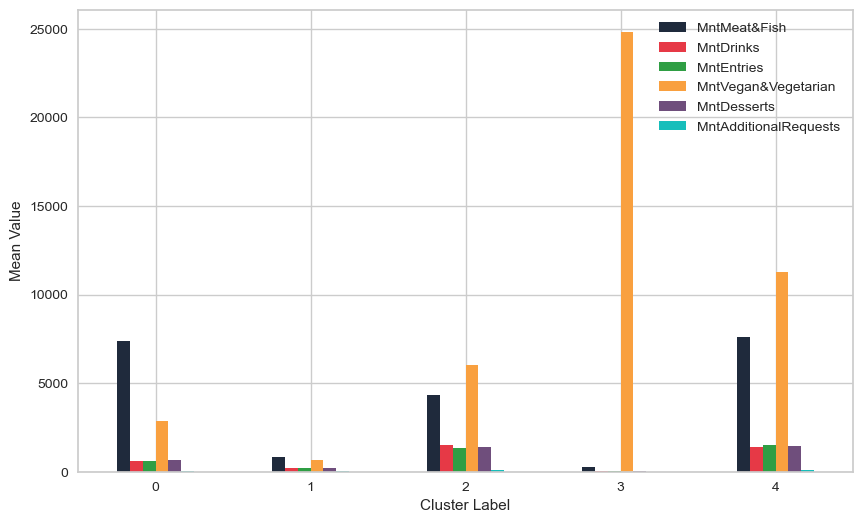

In [72]:
aglo_1 = means.plot.bar(figsize=(10,6), rot=0, color=colors)

aglo_1.set_xlabel('Cluster Label')
aglo_1.set_ylabel('Mean Value')
plt.show()

<AxesSubplot:xlabel='MntMeat&Fish', ylabel='MntVegan&Vegetarian'>

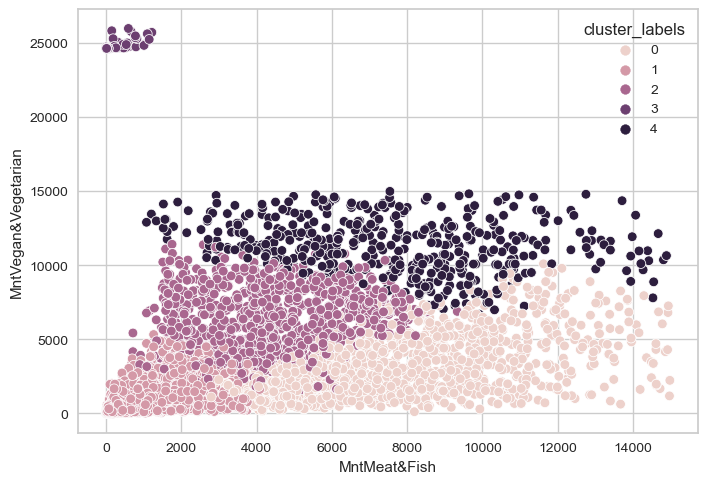

In [73]:
sns.scatterplot(data= food_set_test1, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='cluster_labels')

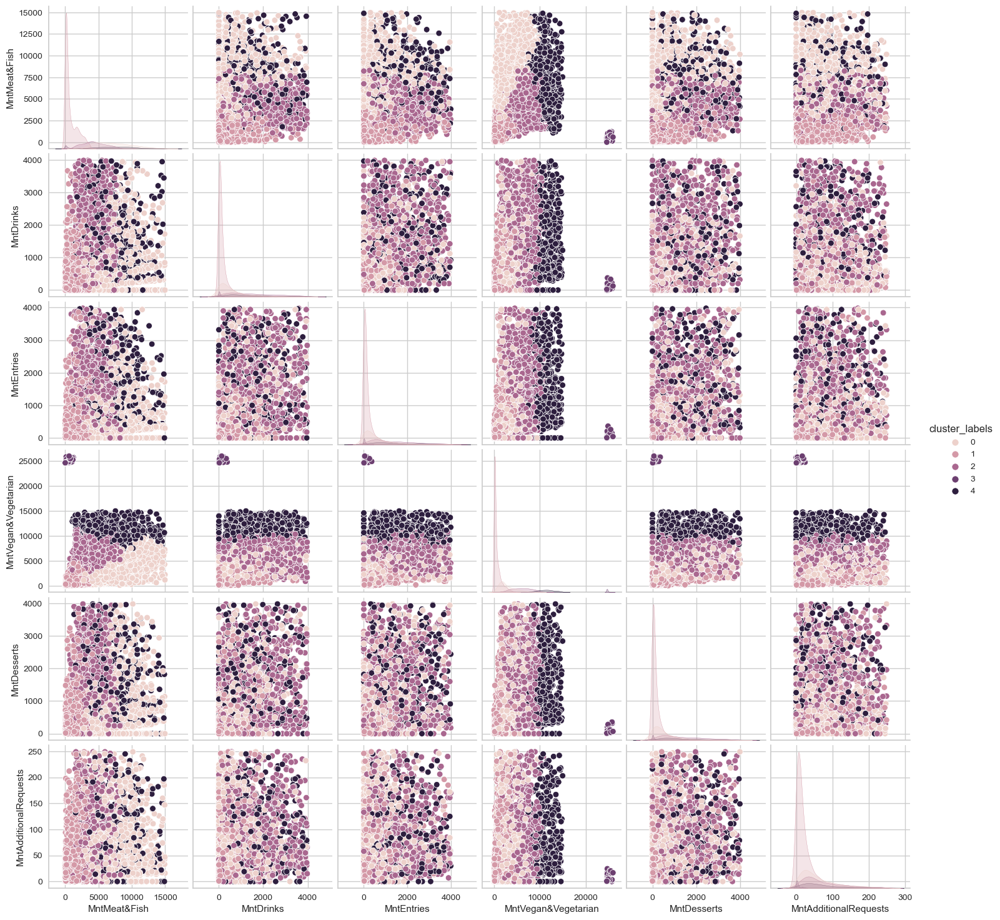

In [74]:
sns.pairplot(data = food_set_test1, hue='cluster_labels')

## Dendogram on our normalized data

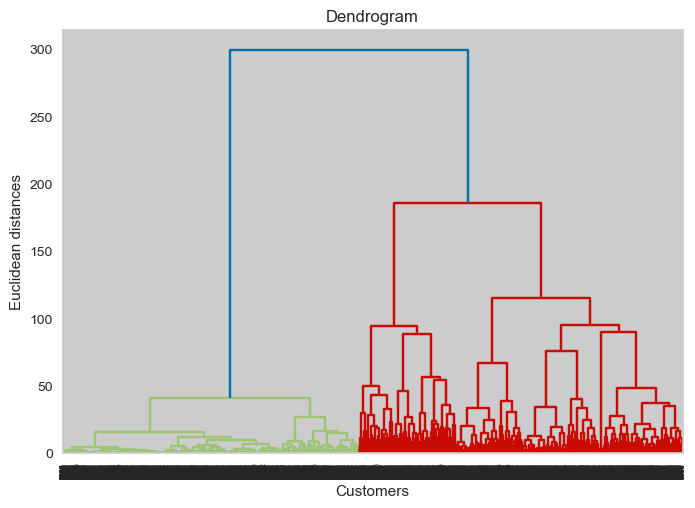

In [75]:
import scipy.cluster.hierarchy as sch
# create dendrogram
dendrogram = sch.dendrogram(sch.linkage(foods_norm, method='ward'))
# add labels to the dendrogram
plt.title("Dendrogram")
plt.xlabel("Customers")
plt.ylabel("Euclidean distances")
plt.show()

###### KMEANS NORMAL DATA

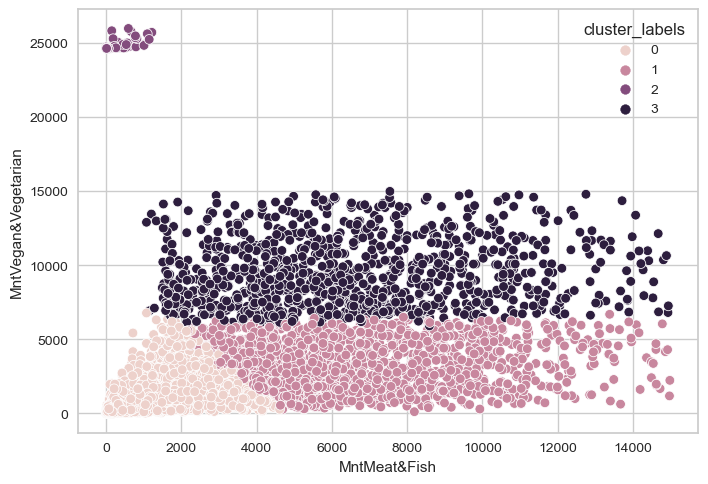

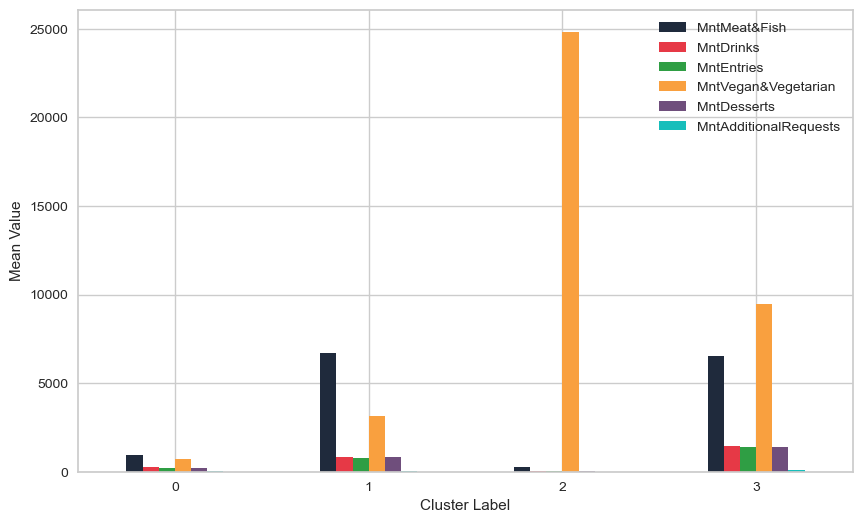

,Score
Silhouette Score,5.510586e-01
Calinski-Harabasz Index,7.324281e+03
WCSS,4.826447e+10
Davies-Bouldin Index,7.949756e-01


In [224]:
from sklearn.cluster import KMeans
test232 = food_set.copy()
model_test232 = KMeans(n_clusters = 4, init='k-means++', random_state = 100).fit(test232)
test232['cluster_labels'] = model_test232.labels_

means_test232 = test232.groupby('cluster_labels').mean()
means_test232

sns.scatterplot(data= test232, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='cluster_labels')
cluster_scores(food_set,model_test232.labels_,model_test232)
aglo_test232 = means_test232.plot.bar(figsize=(10,6), rot=0, color=colors)

aglo_test232.set_xlabel('Cluster Label')
aglo_test232.set_ylabel('Mean Value')
plt.show()

cluster_scores(food_set,model_test232.labels_,model_test232)

In [218]:
counts = test232['cluster_labels'].value_counts()
counts

0    4292
1    1627
3    1018
2      63
Name: cluster_labels, dtype: int64

In [207]:
food_set_noveg

,MntMeat&Fish,MntDrinks,MntEntries,MntVegan&Vegetarian,MntDesserts,MntAdditionalRequests
0,5180.0,2800.0,1400,9240.0,840.0,28.0
1,8450.0,1220.0,300,8760.0,600.0,30.0
2,140.0,0.0,160,150.0,200.0,27.0
3,5320.0,1060.0,1760,2520.0,880.0,133.0
4,6710.0,900.0,1120,4770.0,900.0,216.0
...,...,...,...,...,...,...
7003,6090.0,520.0,880,2820.0,700.0,34.0
7004,4140.0,200.0,2220,5445.0,2220.0,43.0
7005,10170.0,1660.0,660,6255.0,2000.0,16.0
7006,6750.0,3220.0,0,6390.0,410.0,58.0


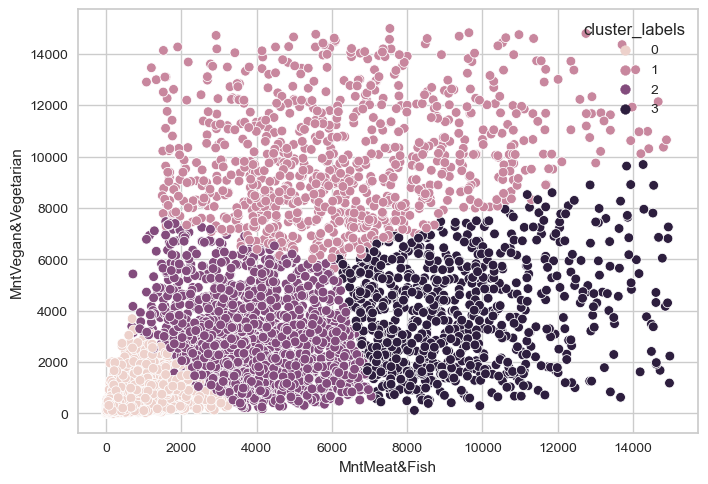

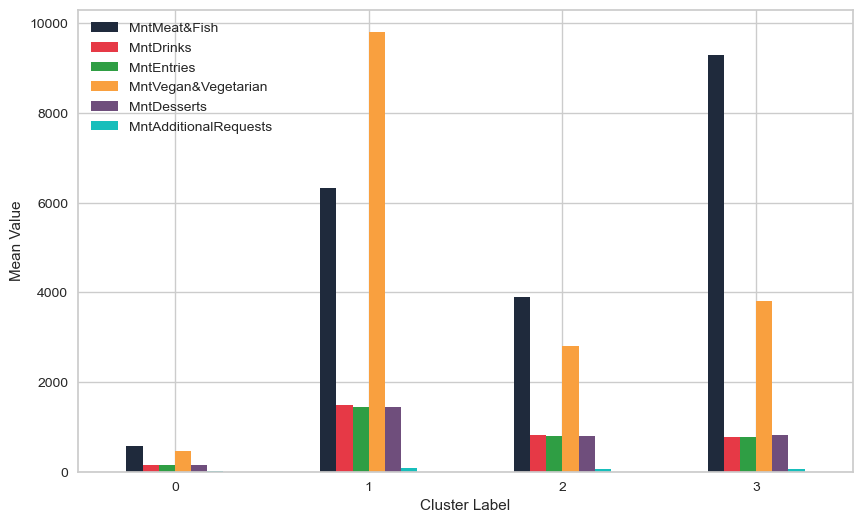

,Score
Silhouette Score,0.5114
Calinski-Harabasz Index,8302.8667
WCSS,36664148939.6919
Davies-Bouldin Index,0.9293


In [226]:
from sklearn.cluster import KMeans
test233 = food_set_noveg.copy()
model_test233 = KMeans(n_clusters = 4, init='k-means++', random_state = 100).fit(test233)
test233['cluster_labels'] = model_test233.labels_

means_test233 = test233.groupby('cluster_labels').mean()
means_test233

sns.scatterplot(data= test233, x='MntMeat&Fish', y='MntVegan&Vegetarian', hue='cluster_labels')

aglo_test233 = means_test233.plot.bar(figsize=(10,6), rot=0, color=colors)

aglo_test233.set_xlabel('Cluster Label')
aglo_test233.set_ylabel('Mean Value')
plt.show()

cluster_scores(food_set_noveg,model_test233.labels_,model_test233)

In [ ]:
wE